In [1]:
import numpy as np
import pandas as pd
# import plot labaries
import matplotlib.pyplot as plt
import seaborn as sns
# import warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# loaded Regression model 
from sklearn.linear_model import LogisticRegression
# laoded classifier model
from sklearn.naive_bayes import GaussianNB,MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
# loaded ensemble model
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier

In [3]:
# Loaded diffrent model selection
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

In [4]:
# loaded metrics
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix

In [5]:
# loaded dataset
ds=pd.read_csv('HR-Employee-Attrition.csv')
ds

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [6]:
df=pd.DataFrame(ds)
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [8]:
df.head()  #top 5 rows

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [9]:
df.tail()  #bottom 5 rows

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,...,1,80,0,6,3,4,4,3,1,2


In [10]:
df.sample()  #random row

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
961,35,No,Travel_Frequently,482,Research & Development,4,4,Life Sciences,1,1350,...,2,80,0,9,3,3,9,6,1,1


In [11]:
df=df.replace(" ",np.nan)  #check white space in datset

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [13]:
df.isnull().sum().sum()   #check total number of null values

0

No null values are not present in dataset

In [14]:
df.isnull().sum()  #check null values in every columns 

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

No null values not present in columns

<AxesSubplot:>

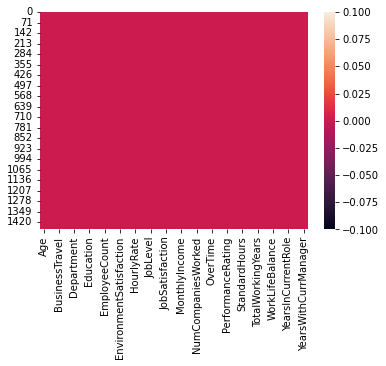

In [15]:
# creat graph for null values
sns.heatmap(df.isnull())

In [16]:
type(df)  #check dataset type

pandas.core.frame.DataFrame

# Separate Numerical Data

In [17]:
df2=df.select_dtypes(['int'])
df2

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1102,1,2,1,1,2,94,3,2,...,1,80,0,8,0,1,6,4,0,5
1,49,279,8,1,1,2,3,61,2,2,...,4,80,1,10,3,3,10,7,1,7
2,37,1373,2,2,1,4,4,92,2,1,...,2,80,0,7,3,3,0,0,0,0
3,33,1392,3,4,1,5,4,56,3,1,...,3,80,0,8,3,3,8,7,3,0
4,27,591,2,1,1,7,1,40,3,1,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884,23,2,1,2061,3,41,4,2,...,3,80,1,17,3,3,5,2,0,3
1466,39,613,6,1,1,2062,4,42,2,3,...,1,80,1,9,5,3,7,7,1,7
1467,27,155,4,3,1,2064,2,87,4,2,...,2,80,1,6,0,3,6,2,0,3
1468,49,1023,2,3,1,2065,4,63,2,2,...,4,80,0,17,3,2,9,6,0,8


# Analyze categorical data

In [18]:
# separate object types data
df1=df.select_dtypes('object')
df1

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
0,Yes,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Y,Yes
1,No,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,Y,No
2,Yes,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Y,Yes
3,No,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Y,Yes
4,No,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No
...,...,...,...,...,...,...,...,...,...
1465,No,Travel_Frequently,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No
1466,No,Travel_Rarely,Research & Development,Medical,Male,Healthcare Representative,Married,Y,No
1467,No,Travel_Rarely,Research & Development,Life Sciences,Male,Manufacturing Director,Married,Y,Yes
1468,No,Travel_Frequently,Sales,Medical,Male,Sales Executive,Married,Y,No


In object type data we have 1470 rows and 9 columns

In [19]:
#Mapping the attrition 1 - yes and 0 - no in the new column

df1["left"] = np.where(df1["Attrition"] == "Yes",1,0)

In [20]:
df1

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime,left
0,Yes,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Y,Yes,1
1,No,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,Y,No,0
2,Yes,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Y,Yes,1
3,No,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Y,Yes,0
4,No,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No,0
...,...,...,...,...,...,...,...,...,...,...
1465,No,Travel_Frequently,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No,0
1466,No,Travel_Rarely,Research & Development,Medical,Male,Healthcare Representative,Married,Y,No,0
1467,No,Travel_Rarely,Research & Development,Life Sciences,Male,Manufacturing Director,Married,Y,Yes,0
1468,No,Travel_Frequently,Sales,Medical,Male,Sales Executive,Married,Y,No,0


# Unique Values In Categorical Data

In [21]:
df1['Attrition'].unique()  #check unique value in Attrition variable

array(['Yes', 'No'], dtype=object)

In [22]:
df1['BusinessTravel'].unique()  #check unique value in BusinessTravel variable

array(['Travel_Rarely', 'Travel_Frequently', 'Non-Travel'], dtype=object)

In [23]:
df1['Department'].unique()  #check unique value in Department variable

array(['Sales', 'Research & Development', 'Human Resources'], dtype=object)

In [24]:
df1['EducationField'].unique()  #check unique value in EducationField variable

array(['Life Sciences', 'Other', 'Medical', 'Marketing',
       'Technical Degree', 'Human Resources'], dtype=object)

In [25]:
df1['Gender'].unique()  #check unique value in Gender variable

array(['Female', 'Male'], dtype=object)

In [26]:
df1['JobRole'].unique()  #check unique value in JobRole variable

array(['Sales Executive', 'Research Scientist', 'Laboratory Technician',
       'Manufacturing Director', 'Healthcare Representative', 'Manager',
       'Sales Representative', 'Research Director', 'Human Resources'],
      dtype=object)

In [27]:
df1['MaritalStatus'].unique()  #check unique value in Maritalstatus variable

array(['Single', 'Married', 'Divorced'], dtype=object)

In [28]:
df1['Over18'].unique()  #check unique value in Over18 variable

array(['Y'], dtype=object)

In [29]:
df1['OverTime'].unique()  #check unique value in OverTime variable

array(['Yes', 'No'], dtype=object)

# Count Plot of object type data

No     1233
Yes     237
Name: Attrition, dtype: int64

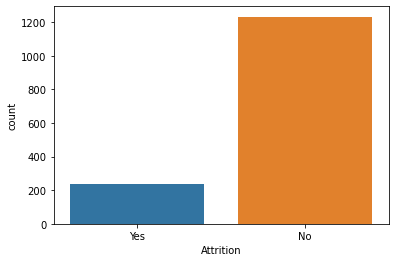

In [30]:
# Count plot of Attrition variable
sns.countplot(df['Attrition'])
df['Attrition'].value_counts()

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64

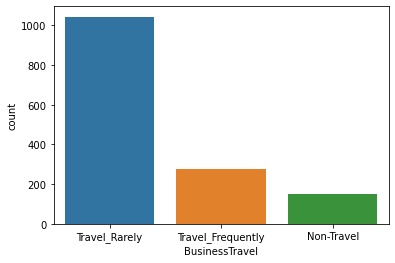

In [31]:
# Count plot of BusinessTravel variable
sns.countplot(df['BusinessTravel'])
df['BusinessTravel'].value_counts()

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64

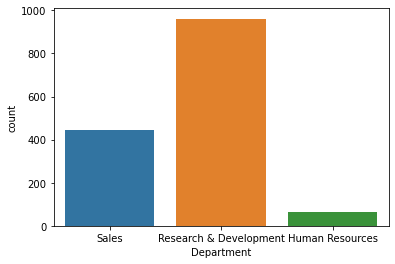

In [32]:
# Count plot of Department variable
sns.countplot(df['Department'])
df['Department'].value_counts()

Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64

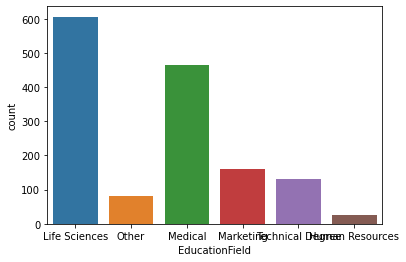

In [33]:
# Count plot of EducationField variable
sns.countplot(df['EducationField'])
df['EducationField'].value_counts()

Male      882
Female    588
Name: Gender, dtype: int64

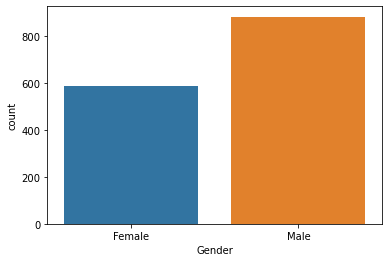

In [34]:
# Count plot of Gender variable
sns.countplot(df['Gender'])
df['Gender'].value_counts()

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64

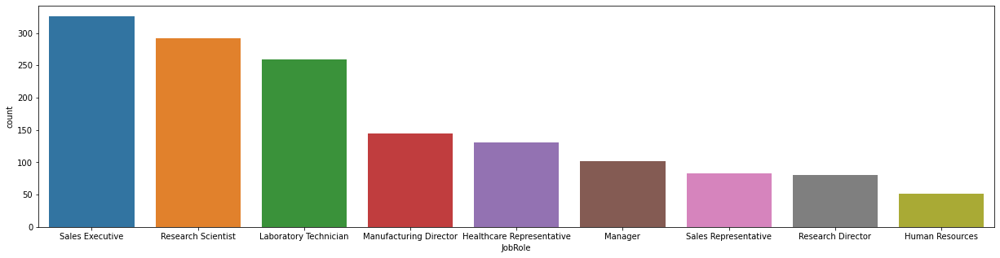

In [35]:
# Count plot of JobRole variable
plt.figure(figsize=(21,5))
sns.countplot(df['JobRole'])
df['JobRole'].value_counts()

Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64

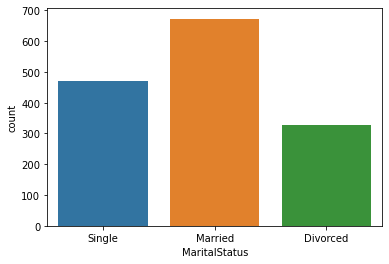

In [36]:
# Count plot of MaritalStatus variable
sns.countplot(df['MaritalStatus'])
df['MaritalStatus'].value_counts()

Y    1470
Name: Over18, dtype: int64

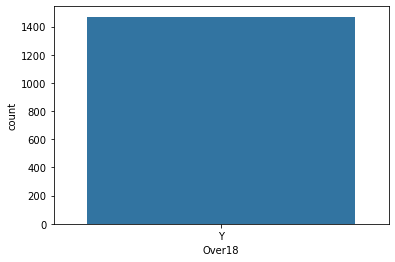

In [37]:
# Count plot of Over18 variable
sns.countplot(df['Over18'])
df['Over18'].value_counts()

No     1054
Yes     416
Name: OverTime, dtype: int64

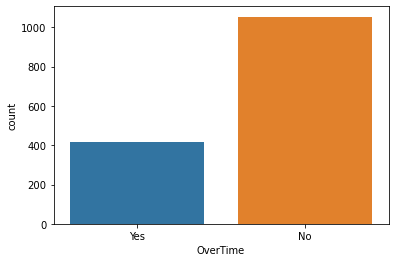

In [38]:
# Count plot of OverTime variable
sns.countplot(df['OverTime'])
df['OverTime'].value_counts()

In [39]:
def CategoricalVariables_targetPlots(df1,variable,invert_axis = False, target_var = "left"):
    
    """A function for Plotting the effect of variables(categorical data) on attrition """
    
    fig, ax = plt.subplots(ncols= 2, figsize = (14,6))
    
    #countplot for distribution along with target variable
    #invert axis variable helps to inter change the axis so that names of categories doesn't overlap
    if invert_axis == False:
        sns.countplot(x = variable, data=df1,hue="Attrition",ax=ax[0])
    else:
        sns.countplot(y =variable, data=df1,hue="Attrition",ax=ax[0])
        
    ax[0].set_title(f"Comparision of {variable} vs Attrition")
    
    #plot the effect of variable on attrition
    if invert_axis == False:
        sns.barplot(x = variable, y = target_var ,data=df1)
    else:
        sns.barplot(y =variable, x = target_var ,data=df1)
        
    ax[1].set_title("Attrition rate by {}".format(variable))
    ax[1].set_ylabel("Average(Attrition)")
    plt.tight_layout()
    plt.show()

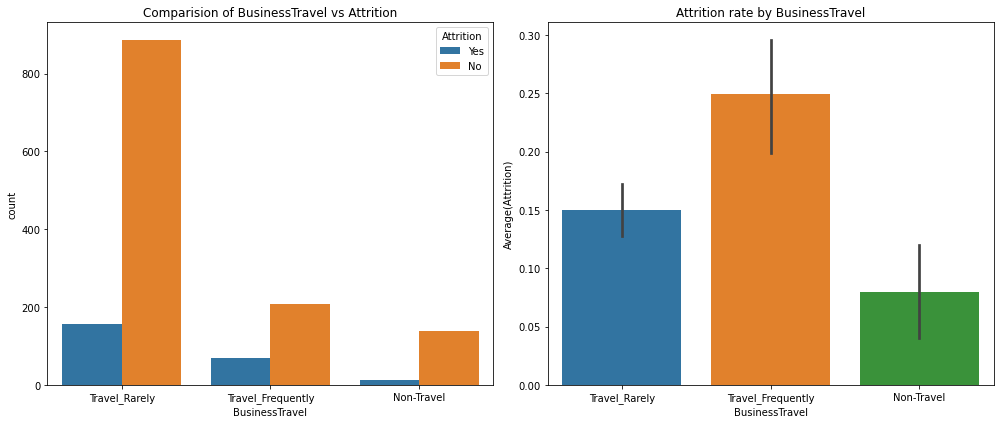

In [40]:
CategoricalVariables_targetPlots(df1,variable="BusinessTravel")

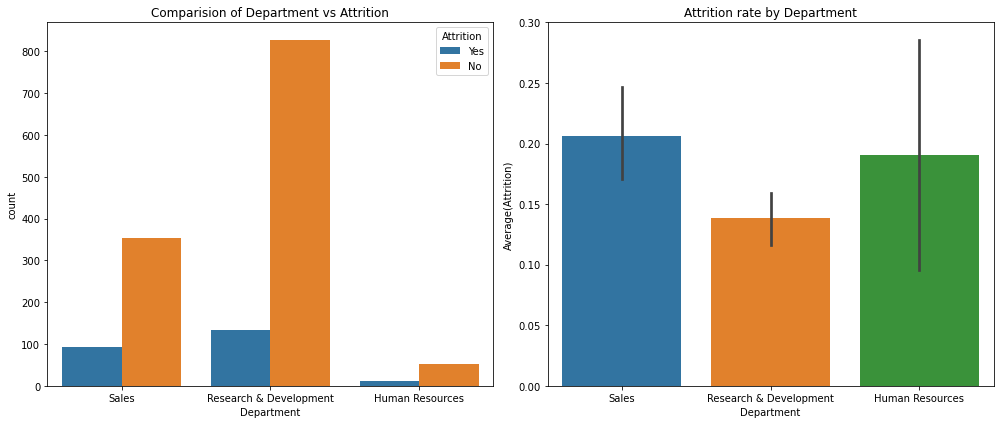

In [41]:
CategoricalVariables_targetPlots(df1,variable="Department")

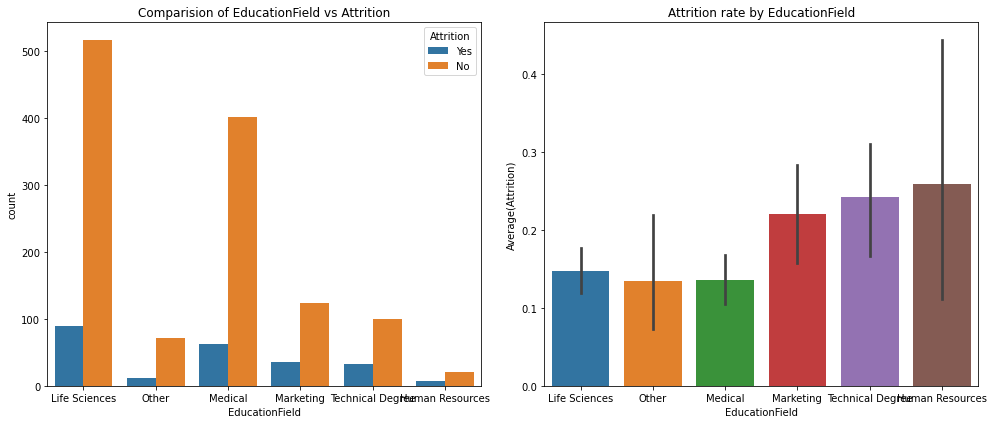

In [42]:
CategoricalVariables_targetPlots(df1,variable="EducationField")

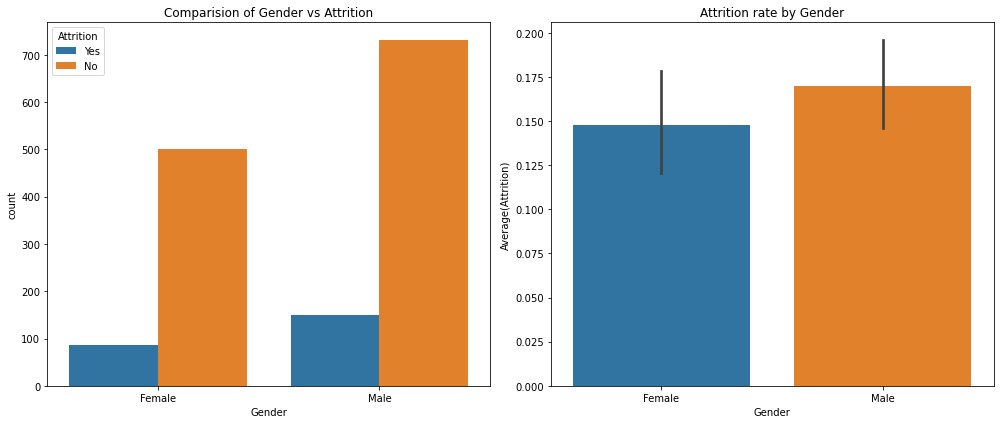

In [43]:
CategoricalVariables_targetPlots(df1,variable="Gender")

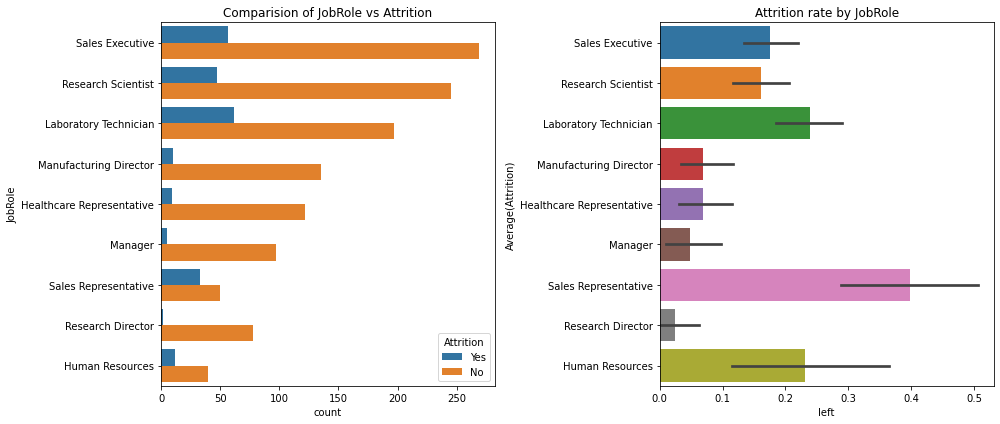

In [44]:
CategoricalVariables_targetPlots(df1,variable="JobRole",invert_axis=True)

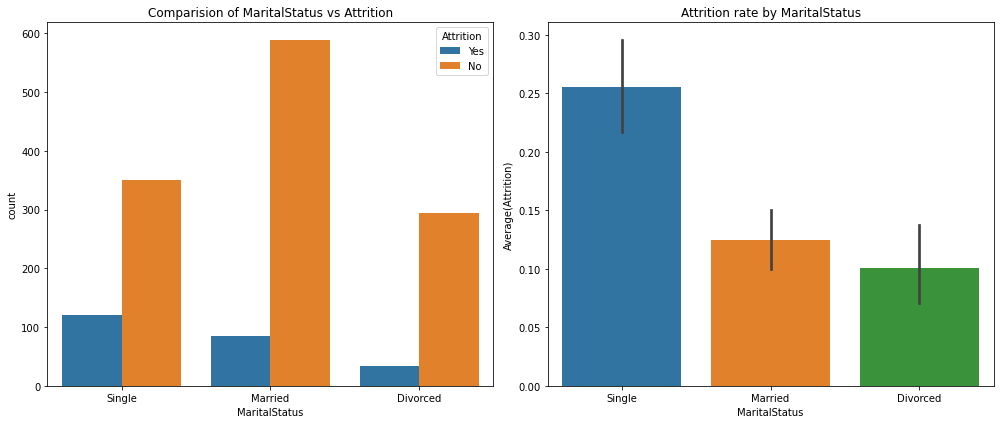

In [45]:
CategoricalVariables_targetPlots(df1,variable="MaritalStatus")

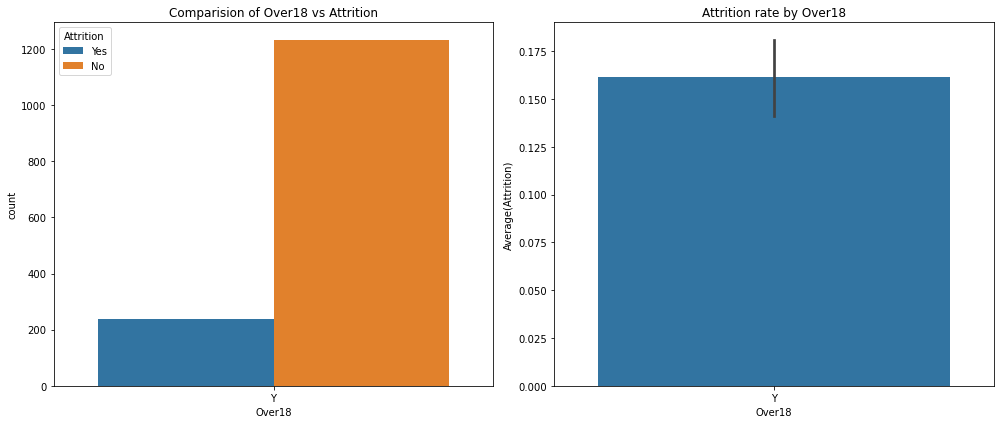

In [46]:
CategoricalVariables_targetPlots(df1,variable="Over18")

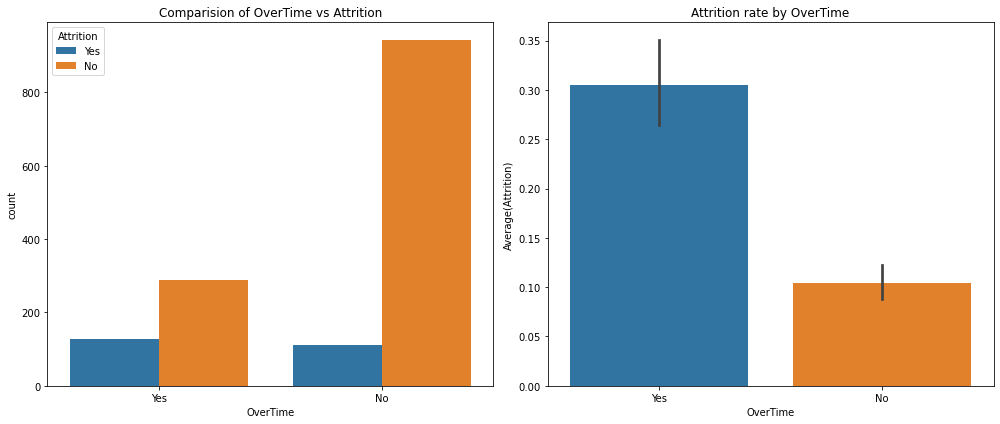

In [47]:
CategoricalVariables_targetPlots(df1,variable="OverTime")

# Encoding Method

In [48]:
from sklearn.preprocessing import LabelEncoder   #chage category t int form by encoder method

In [49]:
le=LabelEncoder()

In [50]:
for i in df1.columns:
    df1[i]=le.fit_transform(df1[i])

In [51]:
df1

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime,left
0,1,2,2,1,0,7,2,0,1,1
1,0,1,1,1,1,6,1,0,0,0
2,1,2,1,4,1,2,2,0,1,1
3,0,1,1,1,0,6,1,0,1,0
4,0,2,1,3,1,2,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...
1465,0,1,1,3,1,2,1,0,0,0
1466,0,2,1,3,1,0,1,0,0,0
1467,0,2,1,1,1,4,1,0,1,0
1468,0,1,2,3,1,7,1,0,0,0


In [52]:
df1.info()   #check info after apply label encoder technique

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   Attrition       1470 non-null   int32
 1   BusinessTravel  1470 non-null   int32
 2   Department      1470 non-null   int32
 3   EducationField  1470 non-null   int32
 4   Gender          1470 non-null   int32
 5   JobRole         1470 non-null   int32
 6   MaritalStatus   1470 non-null   int32
 7   Over18          1470 non-null   int32
 8   OverTime        1470 non-null   int32
 9   left            1470 non-null   int64
dtypes: int32(9), int64(1)
memory usage: 63.3 KB


# Merge Both dataset df1 & df2

In [53]:
df=pd.concat([df1,df2],axis=1)
df

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime,left,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,1,2,2,1,0,7,2,0,1,1,...,1,80,0,8,0,1,6,4,0,5
1,0,1,1,1,1,6,1,0,0,0,...,4,80,1,10,3,3,10,7,1,7
2,1,2,1,4,1,2,2,0,1,1,...,2,80,0,7,3,3,0,0,0,0
3,0,1,1,1,0,6,1,0,1,0,...,3,80,0,8,3,3,8,7,3,0
4,0,2,1,3,1,2,1,0,0,0,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,1,1,3,1,2,1,0,0,0,...,3,80,1,17,3,3,5,2,0,3
1466,0,2,1,3,1,0,1,0,0,0,...,1,80,1,9,5,3,7,7,1,7
1467,0,2,1,1,1,4,1,0,1,0,...,2,80,1,6,0,3,6,2,0,3
1468,0,1,2,3,1,7,1,0,0,0,...,4,80,0,17,3,2,9,6,0,8


# Describe Statistic

In [54]:
df.describe()  #check statistic of dataset

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime,left,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,0.161224,1.607483,1.260544,2.247619,0.600000,4.458503,1.097279,0.0,0.282993,0.161224,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,0.367863,0.665455,0.527792,1.331369,0.490065,2.461821,0.730121,0.0,0.450606,0.367863,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,1.000000,1.000000,0.000000,2.000000,1.000000,0.0,0.000000,0.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,0.000000,2.000000,1.000000,2.000000,1.000000,5.000000,1.000000,0.0,0.000000,0.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,0.000000,2.000000,2.000000,3.000000,1.000000,7.000000,2.000000,0.0,1.000000,0.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,1.000000,2.000000,2.000000,5.000000,1.000000,8.000000,2.000000,0.0,1.000000,1.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


# Check Outliers by Plot boxplot

In [55]:
col=df.columns
ncol=10
nrow=15

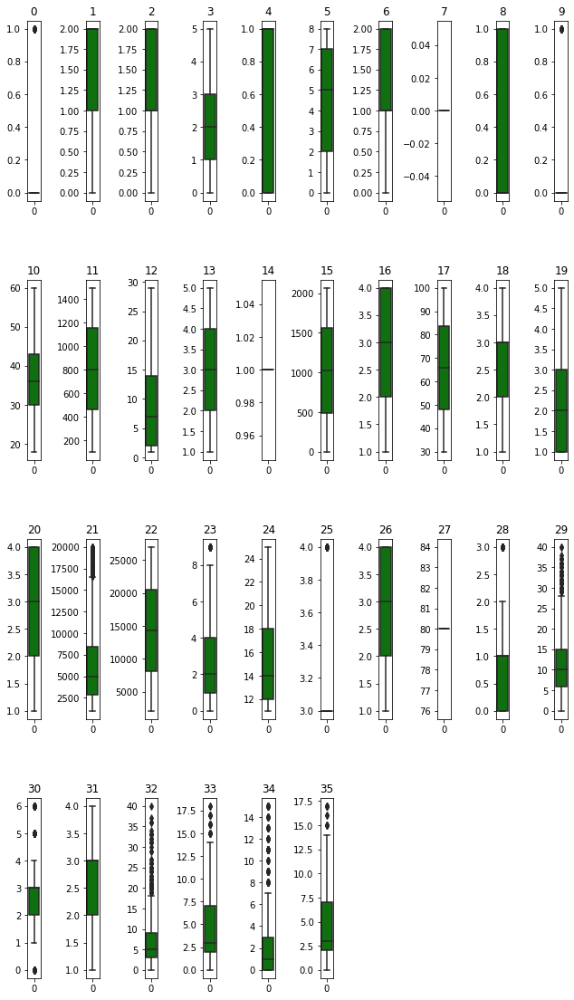

In [56]:
plt.figure(figsize=(ncol,6*ncol))
for i in range(len(col)):
    plt.subplot(nrow,ncol,i+1)
    plt.subplots
    plt.title(i)
    sns.boxplot(data=df[col[i]],color='green',orient='v')
    plt.savefig('Check Outliers Of HR Analytic')
    plt.tight_layout(5,7)

# Uni-Varient-->Dist PLot

<AxesSubplot:xlabel='Attrition', ylabel='Density'>

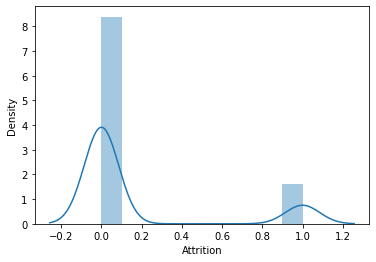

In [57]:
sns.distplot(df.Attrition,bins=10)

<AxesSubplot:xlabel='BusinessTravel', ylabel='Density'>

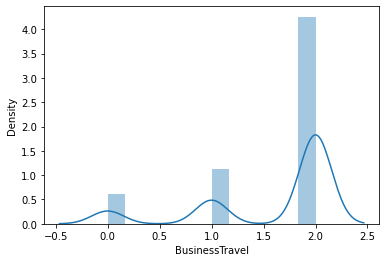

In [58]:
sns.distplot(df.BusinessTravel)

<AxesSubplot:xlabel='Department', ylabel='Density'>

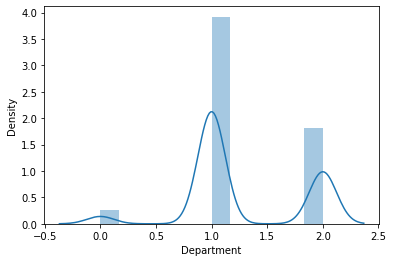

In [59]:
sns.distplot(df.Department)

<AxesSubplot:xlabel='EducationField', ylabel='Density'>

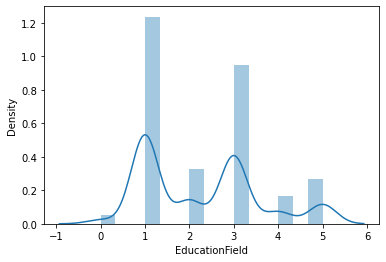

In [61]:
sns.distplot(df.EducationField)

<AxesSubplot:xlabel='Gender', ylabel='Density'>

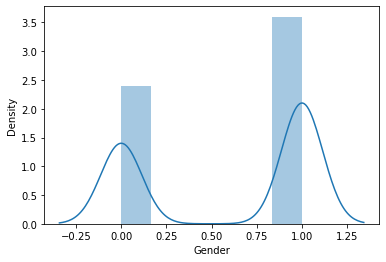

In [62]:
sns.distplot(df.Gender)

<AxesSubplot:xlabel='JobRole', ylabel='Density'>

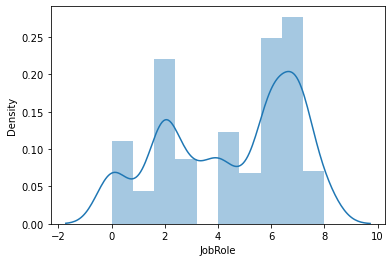

In [63]:
sns.distplot(df.JobRole)

<AxesSubplot:xlabel='MaritalStatus', ylabel='Density'>

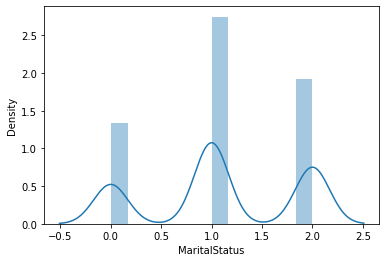

In [64]:
sns.distplot(df.MaritalStatus)

<AxesSubplot:xlabel='Over18', ylabel='Density'>

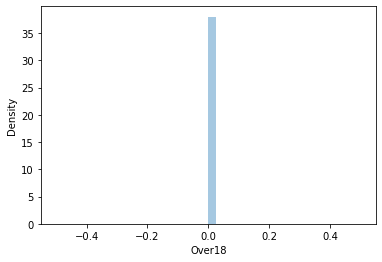

In [65]:
sns.distplot(df.Over18)

<AxesSubplot:xlabel='OverTime', ylabel='Density'>

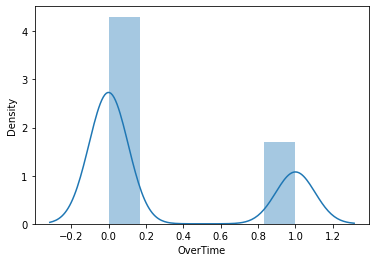

In [66]:
sns.distplot(df.OverTime)

<AxesSubplot:xlabel='Age', ylabel='Density'>

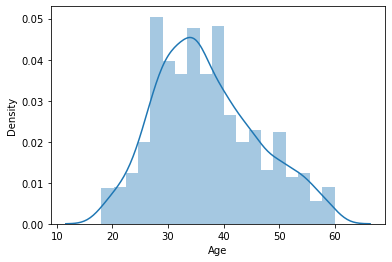

In [67]:
sns.distplot(df.Age)

<AxesSubplot:xlabel='DailyRate', ylabel='Density'>

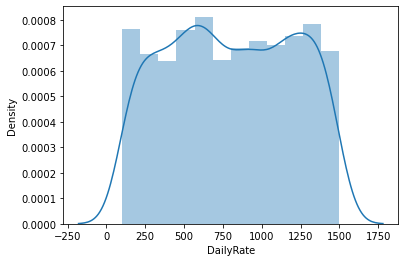

In [68]:
sns.distplot(df.DailyRate)

<AxesSubplot:xlabel='DistanceFromHome', ylabel='Density'>

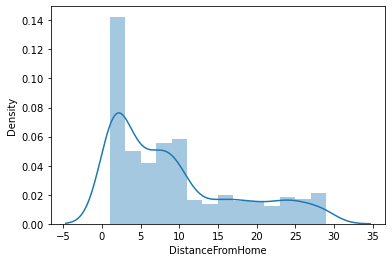

In [69]:
sns.distplot(df.DistanceFromHome)

<AxesSubplot:xlabel='Education', ylabel='Density'>

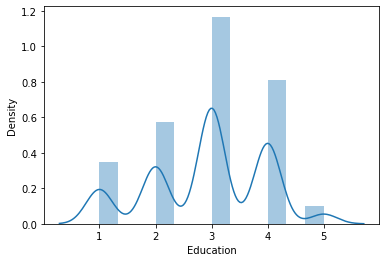

In [70]:
sns.distplot(df.Education)

<AxesSubplot:xlabel='EmployeeCount', ylabel='Density'>

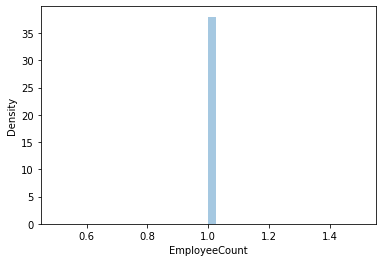

In [71]:
sns.distplot(df.EmployeeCount)

<AxesSubplot:xlabel='EmployeeNumber', ylabel='Density'>

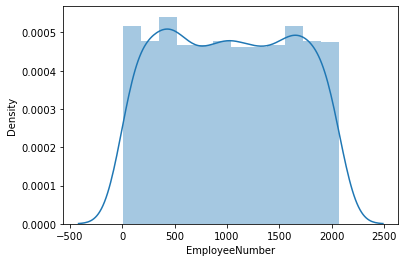

In [72]:
sns.distplot(df.EmployeeNumber)

<AxesSubplot:xlabel='EnvironmentSatisfaction', ylabel='Density'>

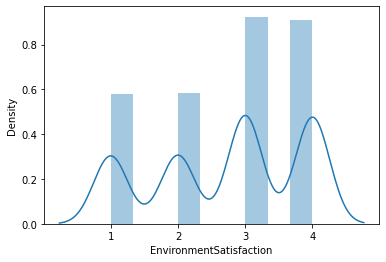

In [73]:
sns.distplot(df.EnvironmentSatisfaction)

<AxesSubplot:xlabel='HourlyRate', ylabel='Density'>

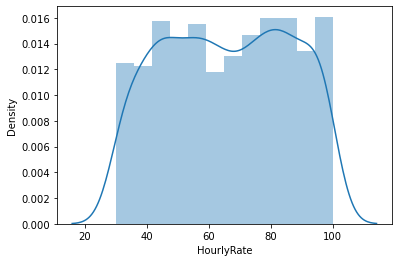

In [74]:
sns.distplot(df.HourlyRate)

<AxesSubplot:xlabel='JobInvolvement', ylabel='Density'>

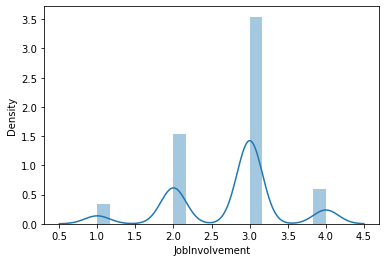

In [75]:
sns.distplot(df.JobInvolvement)

<AxesSubplot:xlabel='JobLevel', ylabel='Density'>

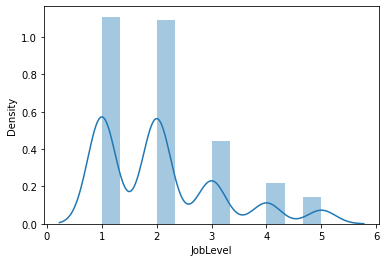

In [76]:
sns.distplot(df.JobLevel)

<AxesSubplot:xlabel='JobSatisfaction', ylabel='Density'>

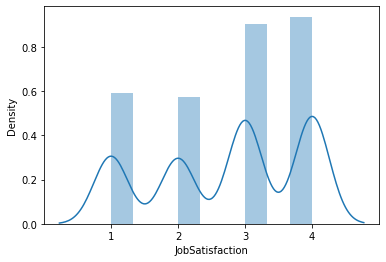

In [77]:
sns.distplot(df.JobSatisfaction)

<AxesSubplot:xlabel='MonthlyIncome', ylabel='Density'>

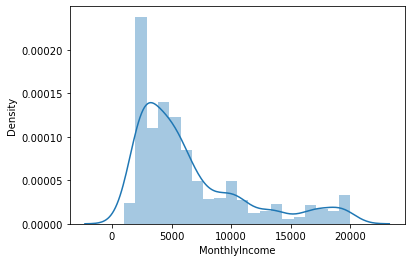

In [78]:
sns.distplot(df.MonthlyIncome)

<AxesSubplot:xlabel='MonthlyRate', ylabel='Density'>

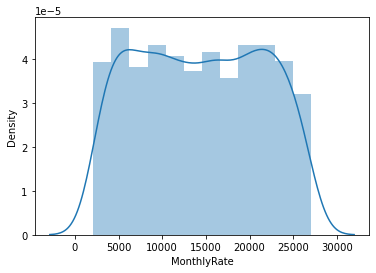

In [79]:
sns.distplot(df.MonthlyRate)

<AxesSubplot:xlabel='NumCompaniesWorked', ylabel='Density'>

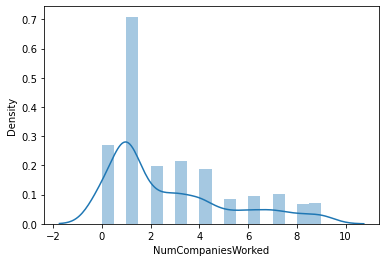

In [80]:
sns.distplot(df.NumCompaniesWorked)

<AxesSubplot:xlabel='PercentSalaryHike', ylabel='Density'>

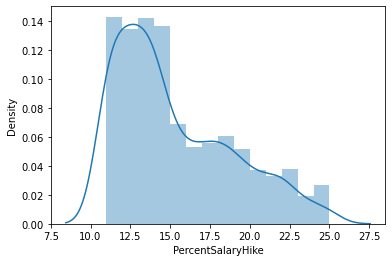

In [81]:
sns.distplot(df.PercentSalaryHike)

<AxesSubplot:xlabel='PerformanceRating', ylabel='Density'>

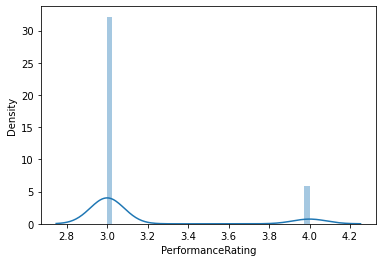

In [82]:
sns.distplot(df.PerformanceRating)

<AxesSubplot:xlabel='RelationshipSatisfaction', ylabel='Density'>

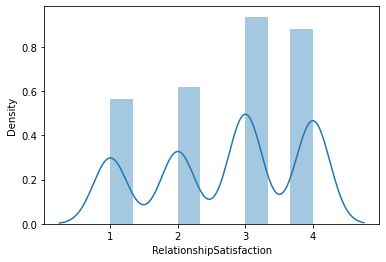

In [83]:
sns.distplot(df.RelationshipSatisfaction)

<AxesSubplot:xlabel='StandardHours', ylabel='Density'>

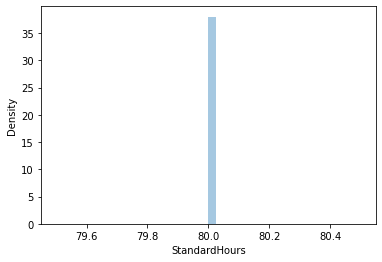

In [84]:
sns.distplot(df.StandardHours)

<AxesSubplot:xlabel='StockOptionLevel', ylabel='Density'>

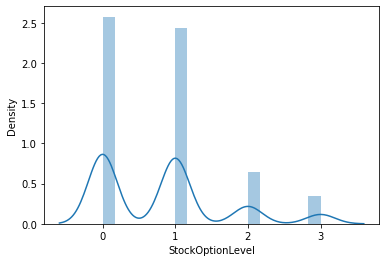

In [85]:
sns.distplot(df.StockOptionLevel)

<AxesSubplot:xlabel='TotalWorkingYears', ylabel='Density'>

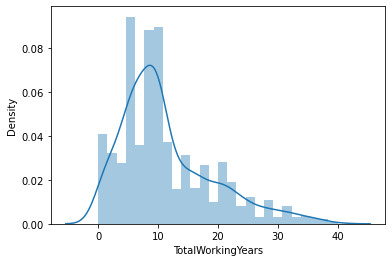

In [86]:
sns.distplot(df.TotalWorkingYears)

<AxesSubplot:xlabel='TrainingTimesLastYear', ylabel='Density'>

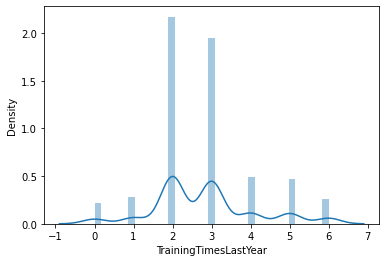

In [87]:
sns.distplot(df.TrainingTimesLastYear)

<AxesSubplot:xlabel='WorkLifeBalance', ylabel='Density'>

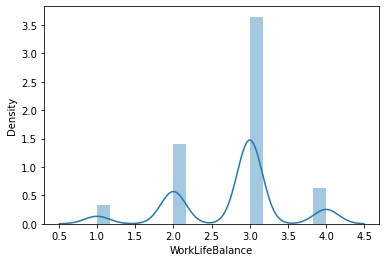

In [88]:
sns.distplot(df.WorkLifeBalance)

<AxesSubplot:xlabel='YearsAtCompany', ylabel='Density'>

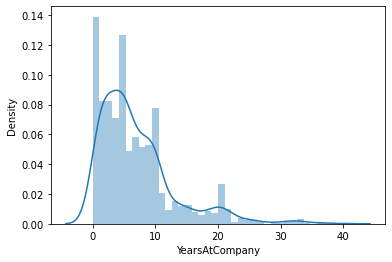

In [89]:
sns.distplot(df.YearsAtCompany)

<AxesSubplot:xlabel='YearsInCurrentRole', ylabel='Density'>

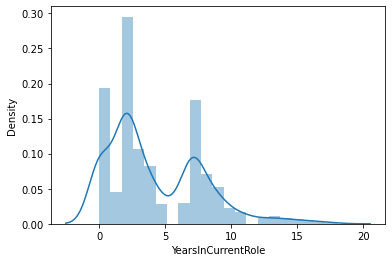

In [90]:
sns.distplot(df.YearsInCurrentRole)

<AxesSubplot:xlabel='YearsSinceLastPromotion', ylabel='Density'>

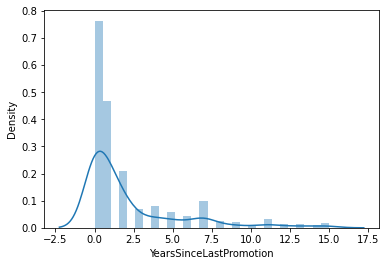

In [91]:
sns.distplot(df.YearsSinceLastPromotion)

<AxesSubplot:xlabel='YearsWithCurrManager', ylabel='Density'>

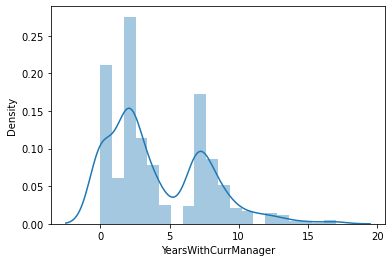

In [92]:
sns.distplot(df.YearsWithCurrManager)

# Numereical data with target plot

In [93]:
def NumericalVariables_targetPlots(df,variable,target_var = "Attrition"):
    """A function for plotting the distribution of numerical variables and its effect on attrition"""
    
    fig,ax = plt.subplots(ncols= 2, figsize = (14,6))    

    #boxplot for comparison
    sns.boxplot(x = target_var, y = variable, data=df, ax=ax[0])
    ax[0].set_title(f"Comparision of {variable} vs {target_var}")
    
    #distribution plot
    ax[1].set_title(f" Distribution of{variable}")
    ax[1].set_ylabel("Frequency")
    sns.distplot(a = df[variable], ax=ax[1])
    
    plt.show()

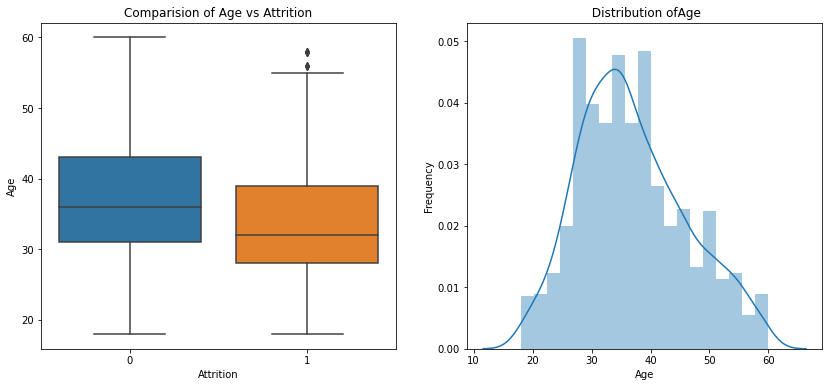

In [94]:
NumericalVariables_targetPlots(df,variable="Age")

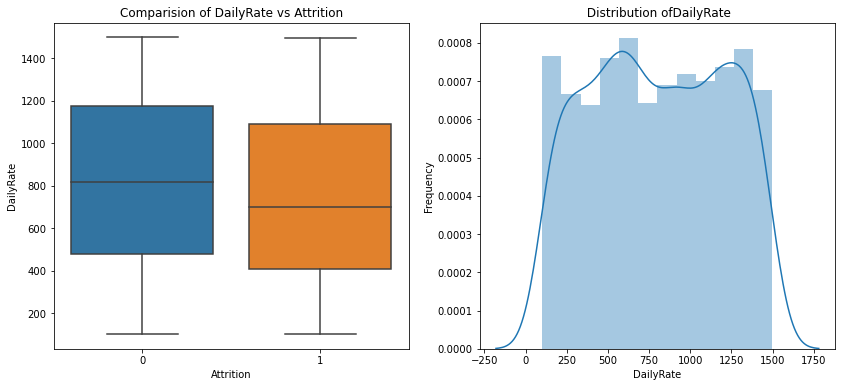

In [95]:
NumericalVariables_targetPlots(df,variable="DailyRate")

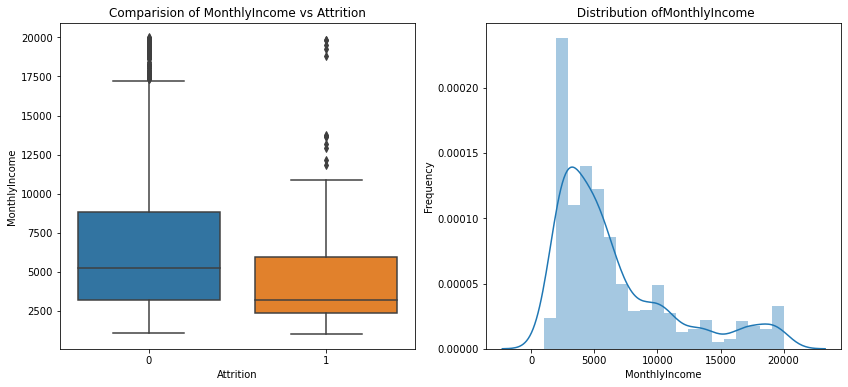

In [96]:
NumericalVariables_targetPlots(df,variable="MonthlyIncome")

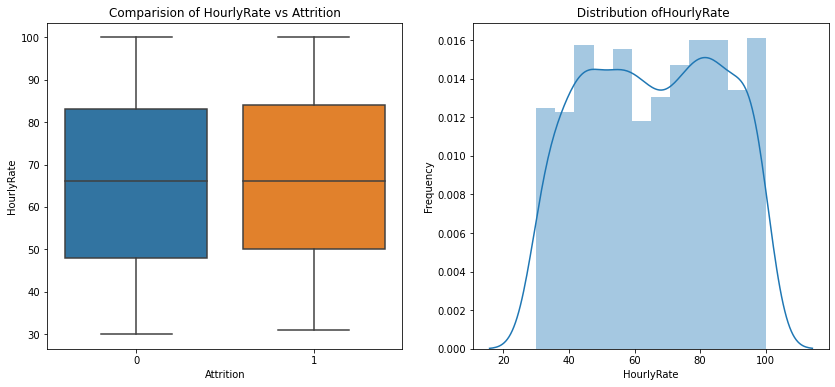

In [97]:
NumericalVariables_targetPlots(df,variable="HourlyRate")

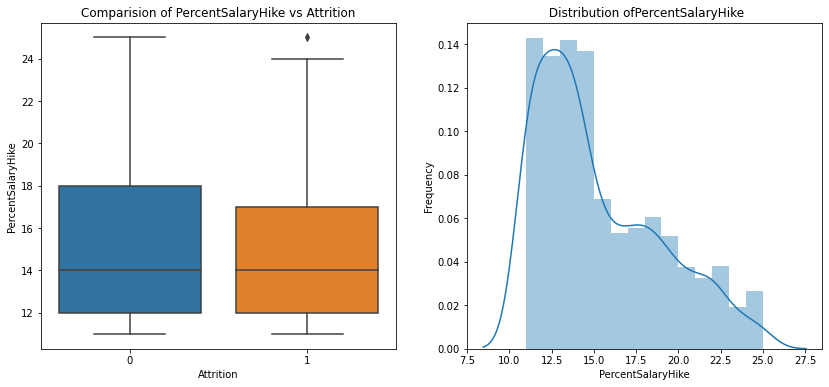

In [98]:
NumericalVariables_targetPlots(df,variable="PercentSalaryHike")

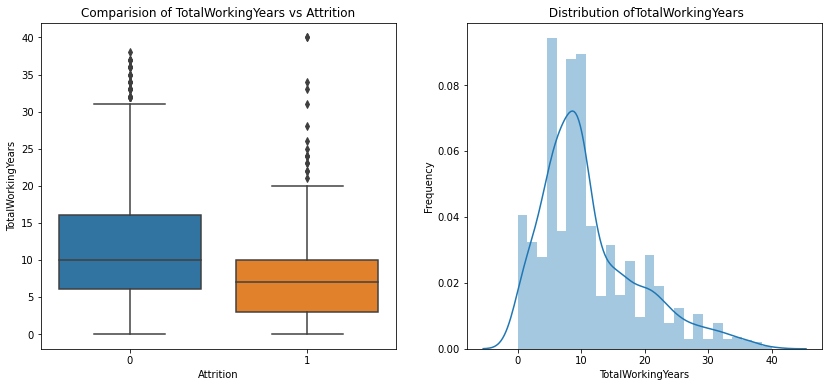

In [99]:
NumericalVariables_targetPlots(df,variable="TotalWorkingYears")

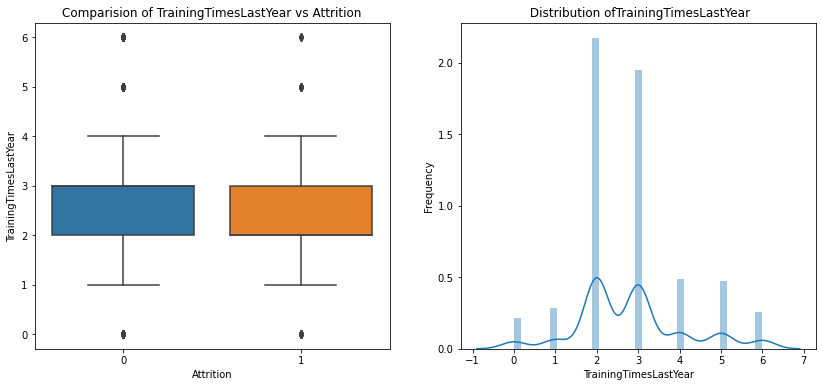

In [100]:
NumericalVariables_targetPlots(df,variable="TrainingTimesLastYear")

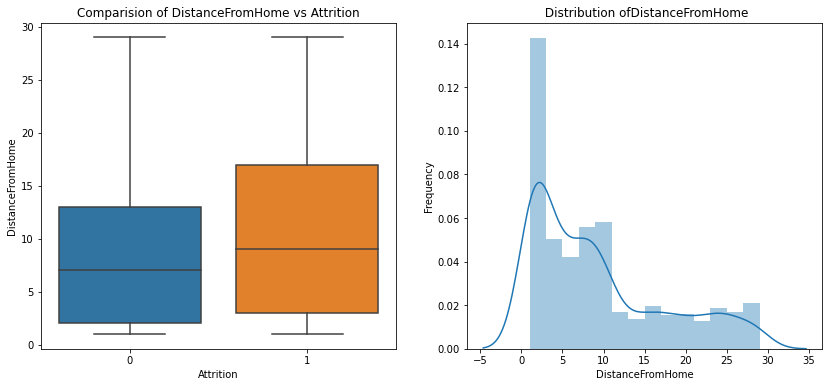

In [101]:
NumericalVariables_targetPlots(df,variable="DistanceFromHome")

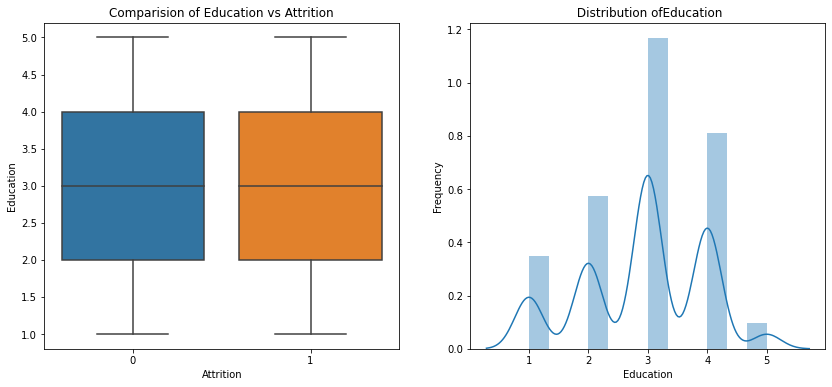

In [102]:
NumericalVariables_targetPlots(df,variable="Education")

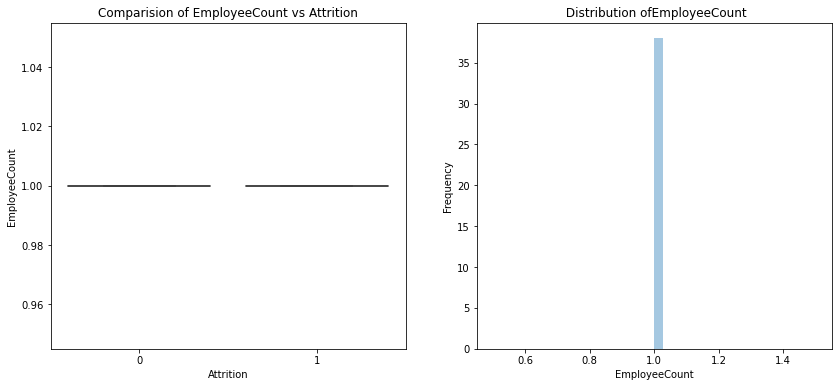

In [103]:
NumericalVariables_targetPlots(df,variable="EmployeeCount")

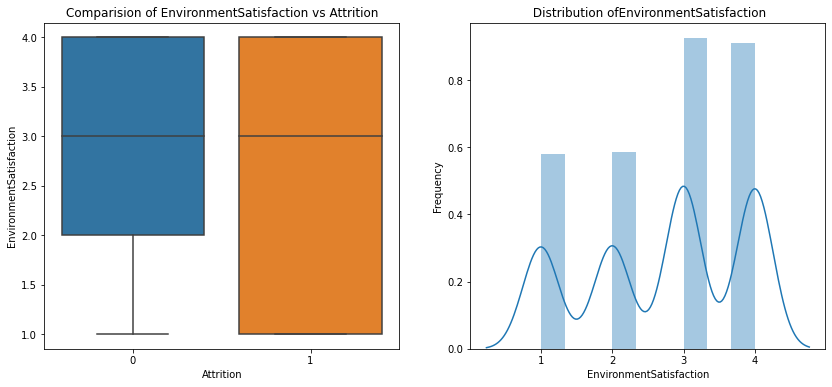

In [104]:
NumericalVariables_targetPlots(df,variable="EnvironmentSatisfaction")

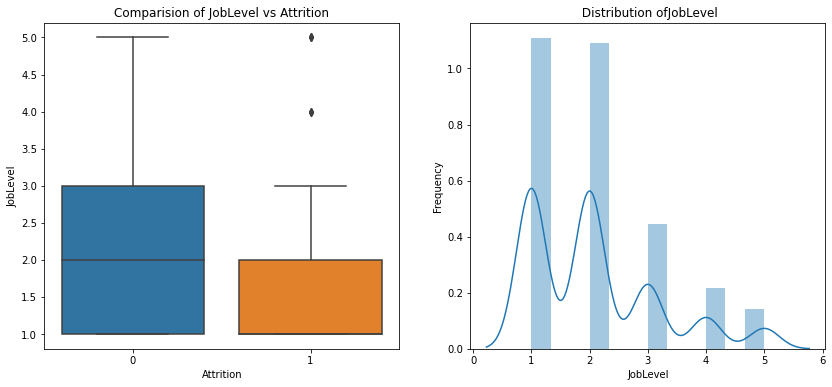

In [105]:
NumericalVariables_targetPlots(df,variable="JobLevel")

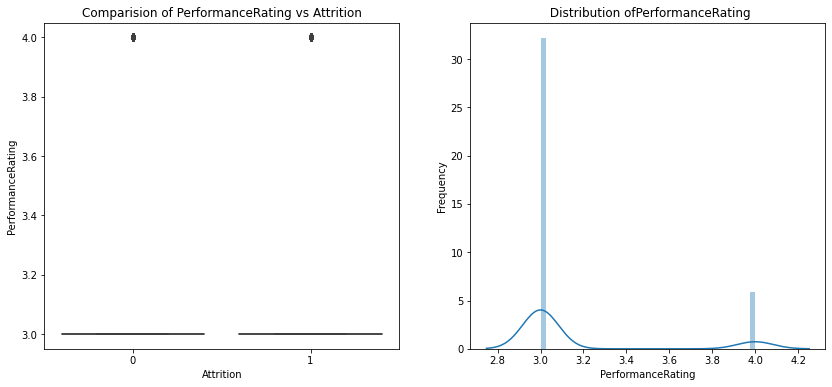

In [106]:
NumericalVariables_targetPlots(df,variable="PerformanceRating")

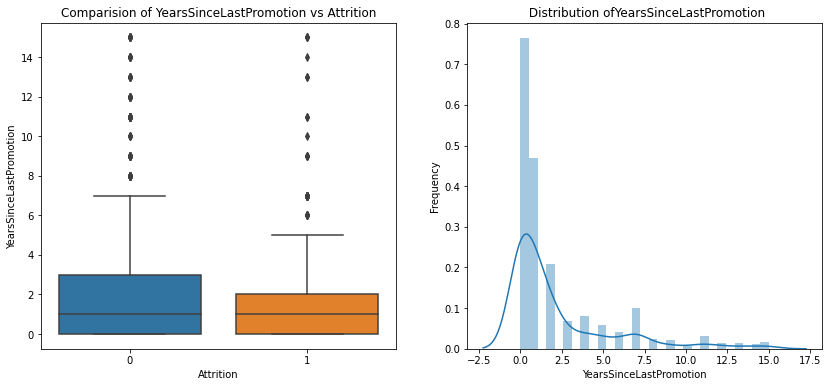

In [107]:
NumericalVariables_targetPlots(df,variable="YearsSinceLastPromotion")

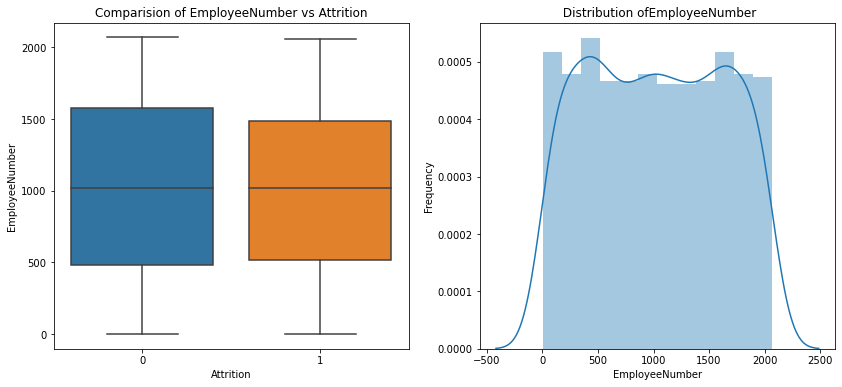

In [108]:
NumericalVariables_targetPlots(df,variable="EmployeeNumber")

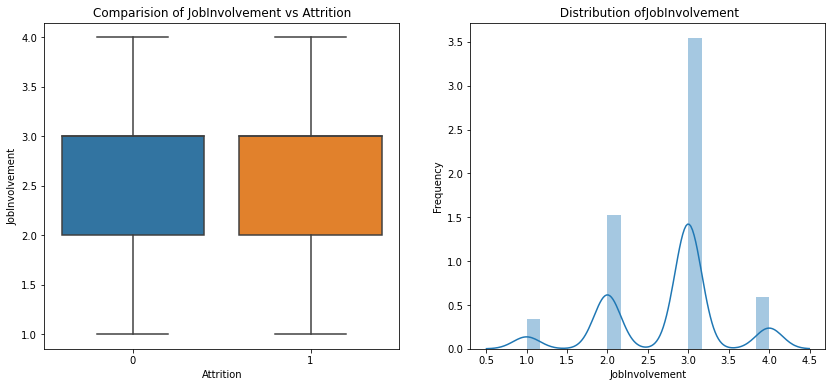

In [109]:
NumericalVariables_targetPlots(df,variable="JobInvolvement")

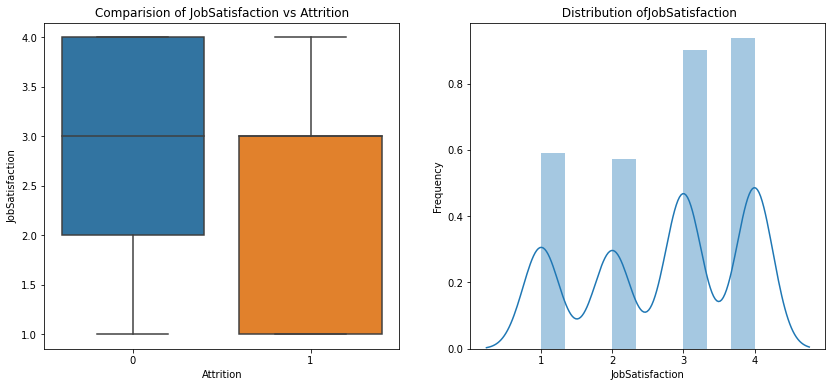

In [110]:
NumericalVariables_targetPlots(df,variable="JobSatisfaction")

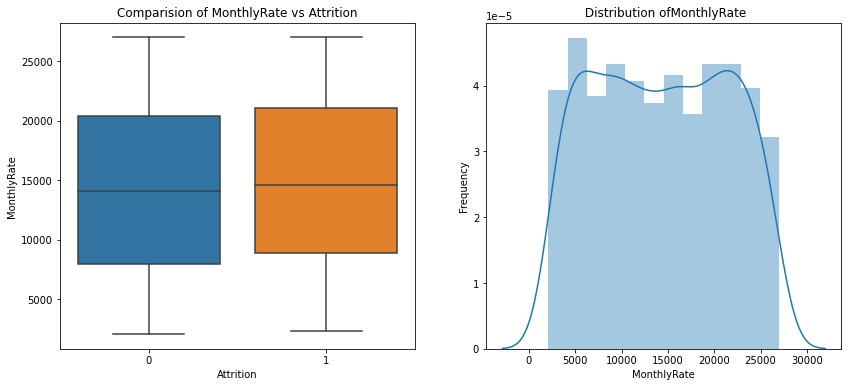

In [111]:
NumericalVariables_targetPlots(df,variable="MonthlyRate")

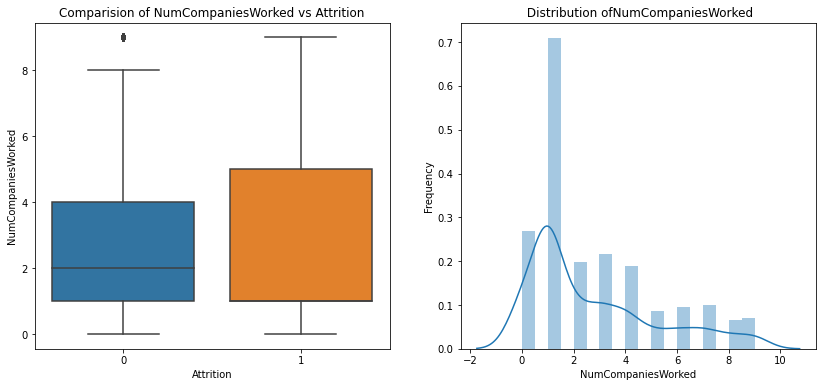

In [112]:
NumericalVariables_targetPlots(df,variable="NumCompaniesWorked")

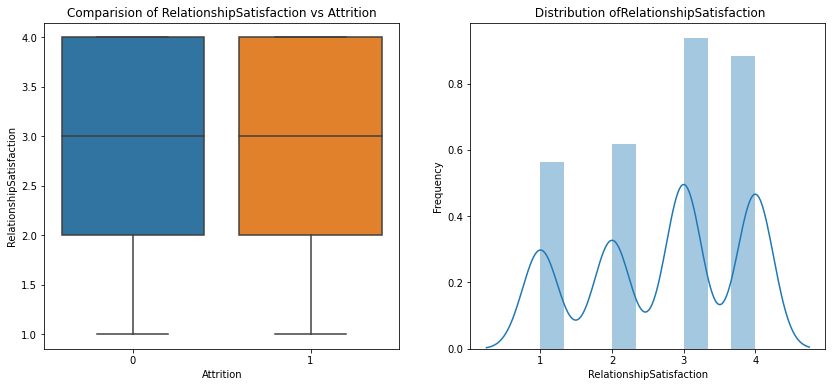

In [113]:
NumericalVariables_targetPlots(df,variable='RelationshipSatisfaction')

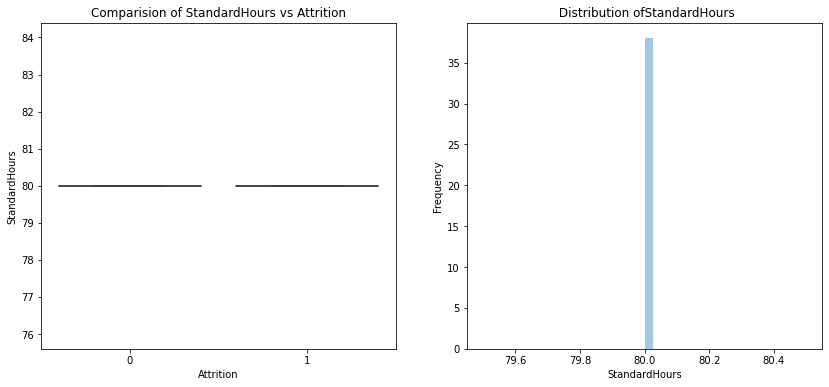

In [114]:
NumericalVariables_targetPlots(df,variable='StandardHours')

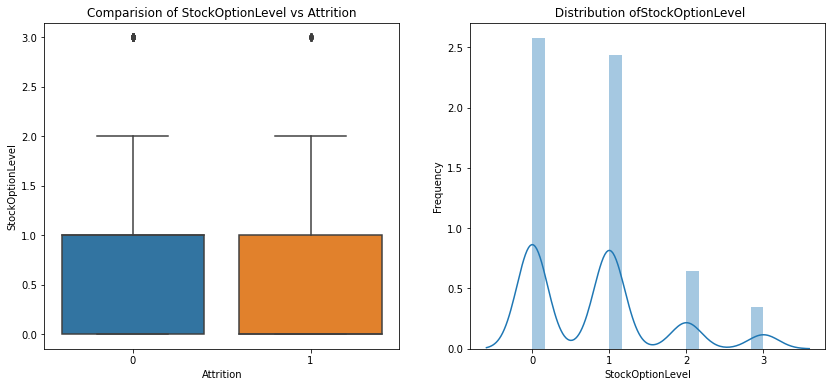

In [115]:
NumericalVariables_targetPlots(df,variable='StockOptionLevel')

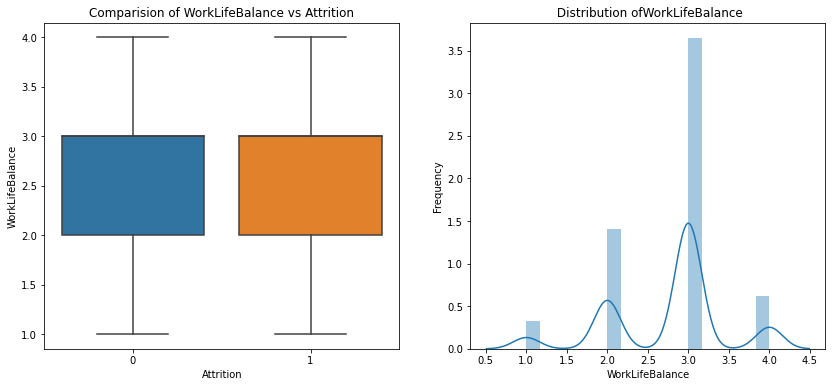

In [116]:
NumericalVariables_targetPlots(df,variable='WorkLifeBalance')

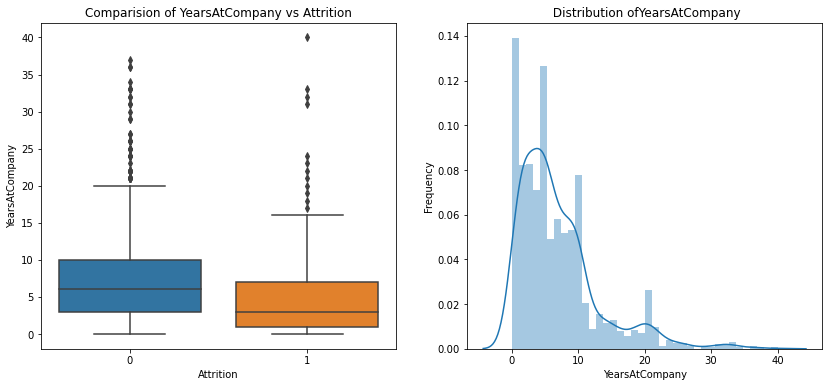

In [117]:
NumericalVariables_targetPlots(df,variable='YearsAtCompany')

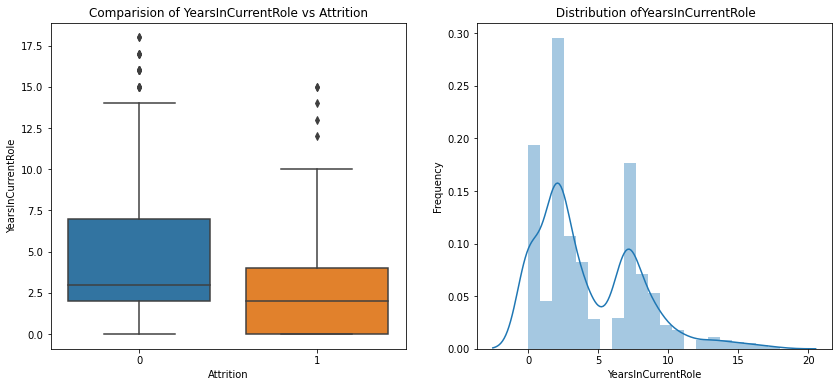

In [118]:
NumericalVariables_targetPlots(df,variable='YearsInCurrentRole')

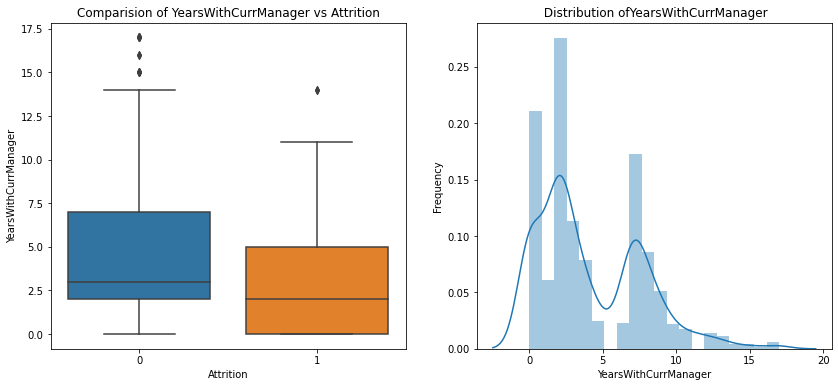

In [119]:
NumericalVariables_targetPlots(df,variable='YearsWithCurrManager')

# Multi varient analysis-Pair plot

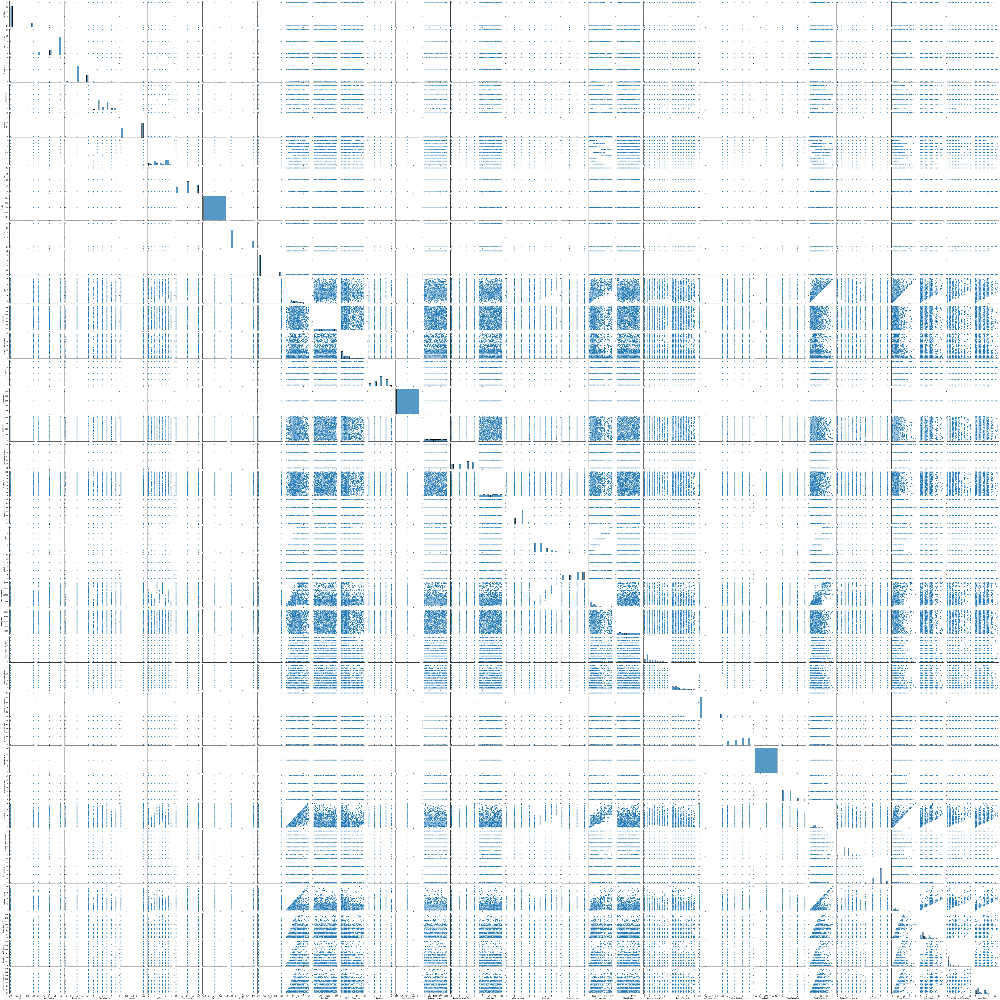

In [120]:
sns.pairplot(df)

# To be check correlation

In [121]:
df2.corr()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,0.010661,-0.001686,0.208034,NaN,-0.010145,0.010146,0.024287,0.029820,0.509604,...,0.053535,NaN,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
DailyRate,0.010661,1.000000,-0.004985,-0.016806,NaN,-0.050990,0.018355,0.023381,0.046135,0.002966,...,0.007846,NaN,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
DistanceFromHome,-0.001686,-0.004985,1.000000,0.021042,NaN,0.032916,-0.016075,0.031131,0.008783,0.005303,...,0.006557,NaN,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.016806,0.021042,1.000000,NaN,0.042070,-0.027128,0.016775,0.042438,0.101589,...,-0.009118,NaN,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EmployeeCount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EmployeeNumber,-0.010145,-0.050990,0.032916,0.042070,NaN,1.000000,0.017621,0.035179,-0.006888,-0.018519,...,-0.069861,NaN,0.062227,-0.014365,0.023603,0.010309,-0.011240,-0.008416,-0.009019,-0.009197
EnvironmentSatisfaction,0.010146,0.018355,-0.016075,-0.027128,NaN,0.017621,1.000000,-0.049857,-0.008278,0.001212,...,0.007665,NaN,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
HourlyRate,0.024287,0.023381,0.031131,0.016775,NaN,0.035179,-0.049857,1.000000,0.042861,-0.027853,...,0.001330,NaN,0.050263,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123
JobInvolvement,0.029820,0.046135,0.008783,0.042438,NaN,-0.006888,-0.008278,0.042861,1.000000,-0.012630,...,0.034297,NaN,0.021523,-0.005533,-0.015338,-0.014617,-0.021355,0.008717,-0.024184,0.025976
JobLevel,0.509604,0.002966,0.005303,0.101589,NaN,-0.018519,0.001212,-0.027853,-0.012630,1.000000,...,0.021642,NaN,0.013984,0.782208,-0.018191,0.037818,0.534739,0.389447,0.353885,0.375281


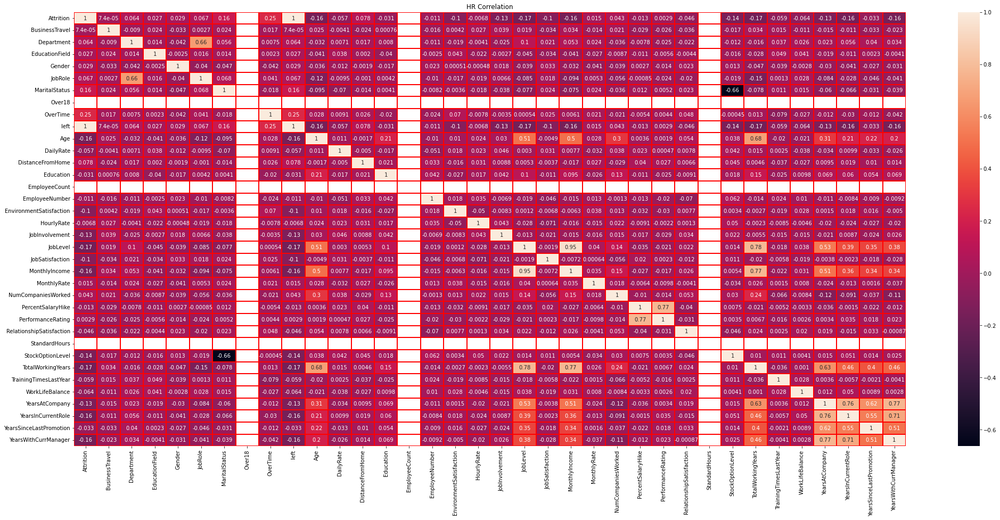

In [122]:
plt.figure(figsize=(35,15))
sns.heatmap(df.corr(),annot=True,linewidth=2,linecolor='r')
plt.title('HR Correlation') 
plt.savefig('HR Correlation')
plt.show()

In [ ]:
# drop bussiness level and Performance Rating bcoz they are very less correlated with dataset
df2=df2.drop(['PerformanceRating'],axis=1)

# Check Outliers

In [125]:
# import outliers check laibaries
from scipy.stats import zscore

In [126]:
df2

,Age,DailyRate,DistanceFromHome,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1102,1,1,2,94,2,4,5993,19479,8,11,8,6,4,0,5
1,49,279,8,2,3,61,2,2,5130,24907,1,23,10,10,7,1,7
2,37,1373,2,4,4,92,1,3,2090,2396,6,15,7,0,0,0,0
3,33,1392,3,5,4,56,1,3,2909,23159,1,11,8,8,7,3,0
4,27,591,2,7,1,40,1,2,3468,16632,9,12,6,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884,23,2061,3,41,2,4,2571,12290,4,17,17,5,2,0,3
1466,39,613,6,2062,4,42,3,1,9991,21457,4,15,9,7,7,1,7
1467,27,155,4,2064,2,87,2,2,6142,5174,1,20,6,6,2,0,3
1468,49,1023,2,2065,4,63,2,2,5390,13243,2,14,17,9,6,0,8


In [123]:
df2=df2.drop(['EmployeeCount','StandardHours','TrainingTimesLastYear','Education','StockOptionLevel',
              'WorkLifeBalance','RelationshipSatisfaction','JobInvolvement','PerformanceRating'],axis=1)

In [127]:
(np.abs(zscore(df2))<3).all().all()  #check outliers

False

In [128]:
(np.abs(zscore(df2))<3).all()

Age                         True
DailyRate                   True
DistanceFromHome            True
EmployeeNumber              True
EnvironmentSatisfaction     True
HourlyRate                  True
JobLevel                    True
JobSatisfaction             True
MonthlyIncome               True
MonthlyRate                 True
NumCompaniesWorked          True
PercentSalaryHike           True
TotalWorkingYears          False
YearsAtCompany             False
YearsInCurrentRole         False
YearsSinceLastPromotion    False
YearsWithCurrManager       False
dtype: bool

# Apply Iqr Method

In [129]:
q1=df2.quantile(0.25)
q1

Age                          30.00
DailyRate                   465.00
DistanceFromHome              2.00
EmployeeNumber              491.25
EnvironmentSatisfaction       2.00
HourlyRate                   48.00
JobLevel                      1.00
JobSatisfaction               2.00
MonthlyIncome              2911.00
MonthlyRate                8047.00
NumCompaniesWorked            1.00
PercentSalaryHike            12.00
TotalWorkingYears             6.00
YearsAtCompany                3.00
YearsInCurrentRole            2.00
YearsSinceLastPromotion       0.00
YearsWithCurrManager          2.00
Name: 0.25, dtype: float64

In [130]:
q2=df2.quantile(0.75)
q2

Age                           43.00
DailyRate                   1157.00
DistanceFromHome              14.00
EmployeeNumber              1555.75
EnvironmentSatisfaction        4.00
HourlyRate                    83.75
JobLevel                       3.00
JobSatisfaction                4.00
MonthlyIncome               8379.00
MonthlyRate                20461.50
NumCompaniesWorked             4.00
PercentSalaryHike             18.00
TotalWorkingYears             15.00
YearsAtCompany                 9.00
YearsInCurrentRole             7.00
YearsSinceLastPromotion        3.00
YearsWithCurrManager           7.00
Name: 0.75, dtype: float64

In [131]:
iqr=q2-q1
iqr

Age                           13.00
DailyRate                    692.00
DistanceFromHome              12.00
EmployeeNumber              1064.50
EnvironmentSatisfaction        2.00
HourlyRate                    35.75
JobLevel                       2.00
JobSatisfaction                2.00
MonthlyIncome               5468.00
MonthlyRate                12414.50
NumCompaniesWorked             3.00
PercentSalaryHike              6.00
TotalWorkingYears              9.00
YearsAtCompany                 6.00
YearsInCurrentRole             5.00
YearsSinceLastPromotion        3.00
YearsWithCurrManager           5.00
dtype: float64

In [132]:
upper=q2+(1.5*iqr)
lower=q1-(1.5*iqr)

In [133]:
df3=df2[(df2>lower) & (df2<upper)]
df3

,Age,DailyRate,DistanceFromHome,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1102,1,1,2,94,2,4,5993.0,19479,8.0,11,8.0,6.0,4.0,0.0,5.0
1,49,279,8,2,3,61,2,2,5130.0,24907,1.0,23,10.0,10.0,7.0,1.0,7.0
2,37,1373,2,4,4,92,1,3,2090.0,2396,6.0,15,7.0,0.0,0.0,0.0,0.0
3,33,1392,3,5,4,56,1,3,2909.0,23159,1.0,11,8.0,8.0,7.0,3.0,0.0
4,27,591,2,7,1,40,1,2,3468.0,16632,NaN,12,6.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884,23,2061,3,41,2,4,2571.0,12290,4.0,17,17.0,5.0,2.0,0.0,3.0
1466,39,613,6,2062,4,42,3,1,9991.0,21457,4.0,15,9.0,7.0,7.0,1.0,7.0
1467,27,155,4,2064,2,87,2,2,6142.0,5174,1.0,20,6.0,6.0,2.0,0.0,3.0
1468,49,1023,2,2065,4,63,2,2,5390.0,13243,2.0,14,17.0,9.0,6.0,0.0,8.0


In [134]:
df3.isnull().sum().sum()

488

In [135]:
df3.isnull().sum()

Age                          0
DailyRate                    0
DistanceFromHome             0
EmployeeNumber               0
EnvironmentSatisfaction      0
HourlyRate                   0
JobLevel                     0
JobSatisfaction              0
MonthlyIncome              114
MonthlyRate                  0
NumCompaniesWorked          52
PercentSalaryHike            0
TotalWorkingYears           63
YearsAtCompany             117
YearsInCurrentRole          21
YearsSinceLastPromotion    107
YearsWithCurrManager        14
dtype: int64

In [136]:
from sklearn.impute import SimpleImputer

In [137]:
imp=SimpleImputer(strategy='median')

In [138]:
for i in df3.columns:
    df3[i]=imp.fit_transform(df3[i].values.reshape(-1,1))

In [139]:
df3

,Age,DailyRate,DistanceFromHome,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41.0,1102.0,1.0,1.0,2.0,94.0,2.0,4.0,5993.0,19479.0,8.0,11.0,8.0,6.0,4.0,0.0,5.0
1,49.0,279.0,8.0,2.0,3.0,61.0,2.0,2.0,5130.0,24907.0,1.0,23.0,10.0,10.0,7.0,1.0,7.0
2,37.0,1373.0,2.0,4.0,4.0,92.0,1.0,3.0,2090.0,2396.0,6.0,15.0,7.0,0.0,0.0,0.0,0.0
3,33.0,1392.0,3.0,5.0,4.0,56.0,1.0,3.0,2909.0,23159.0,1.0,11.0,8.0,8.0,7.0,3.0,0.0
4,27.0,591.0,2.0,7.0,1.0,40.0,1.0,2.0,3468.0,16632.0,1.0,12.0,6.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36.0,884.0,23.0,2061.0,3.0,41.0,2.0,4.0,2571.0,12290.0,4.0,17.0,17.0,5.0,2.0,0.0,3.0
1466,39.0,613.0,6.0,2062.0,4.0,42.0,3.0,1.0,9991.0,21457.0,4.0,15.0,9.0,7.0,7.0,1.0,7.0
1467,27.0,155.0,4.0,2064.0,2.0,87.0,2.0,2.0,6142.0,5174.0,1.0,20.0,6.0,6.0,2.0,0.0,3.0
1468,49.0,1023.0,2.0,2065.0,4.0,63.0,2.0,2.0,5390.0,13243.0,2.0,14.0,17.0,9.0,6.0,0.0,8.0


# Check Skew

In [140]:
df3.skew()

Age                        0.413286
DailyRate                 -0.003519
DistanceFromHome           0.958118
EmployeeNumber             0.016574
EnvironmentSatisfaction   -0.321654
HourlyRate                -0.032311
JobLevel                   1.025401
JobSatisfaction           -0.329672
MonthlyIncome              1.294986
MonthlyRate                0.018578
NumCompaniesWorked         1.036731
PercentSalaryHike          0.821128
TotalWorkingYears          0.824511
YearsAtCompany             0.742226
YearsInCurrentRole         0.700616
YearsSinceLastPromotion    1.661323
YearsWithCurrManager       0.661144
dtype: float64

# Remove skeness by power method

In [141]:
from sklearn.preprocessing import power_transform

In [142]:
df4=power_transform(df3)

In [143]:
type(df4)

numpy.ndarray

In [144]:
df5=pd.DataFrame(data=df4,columns=df3.columns)
df5

,Age,DailyRate,DistanceFromHome,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.522140,0.759289,-1.494085,-2.164110,-0.706596,1.354630,0.241622,1.192743,0.480977,0.747689,1.785820,-1.488918,-0.207845,0.286140,0.231272,-1.113576,0.515906
1,1.276411,-1.334597,0.243416,-2.154174,0.208597,-0.210675,0.241622,-0.709062,0.204639,1.397293,-0.511537,1.679689,0.126021,1.158895,0.949241,0.251362,0.953428
2,0.102091,1.340365,-1.031215,-2.136953,1.209516,1.263094,-1.170135,0.197856,-1.485269,-1.882611,1.424519,0.201133,-0.391202,-2.137329,-1.595403,-1.113576,-1.549233
3,-0.353971,1.379936,-0.700347,-2.129176,1.209516,-0.460197,-1.170135,0.197856,-0.843875,1.193001,-0.511537,-1.488918,-0.207845,0.752665,0.949241,1.155032,-1.549233
4,-1.123755,-0.453941,-1.031215,-2.114724,-1.518118,-1.289301,-1.170135,-0.709062,-0.512114,0.386371,-0.511537,-0.948760,-0.588486,-0.992718,-0.444409,0.824534,-0.405880
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,-0.008279,0.264672,1.407126,1.536992,0.208597,-1.235882,0.241622,1.192743,-1.080800,-0.201548,0.927031,0.719724,1.073942,0.021483,-0.444409,-1.113576,-0.044596
1466,0.316210,-0.397219,-0.050827,1.538245,1.209516,-1.182703,1.009822,-1.509980,1.357265,0.989784,0.927031,0.201133,-0.036031,0.528409,0.949241,0.251362,0.953428
1467,-1.123755,-1.751713,-0.442291,1.540748,-0.706596,1.032601,0.241622,-0.709062,0.524199,-1.325846,-0.511537,1.281630,-0.588486,0.286140,-0.444409,-1.113576,-0.044596
1468,1.276411,0.583235,-1.031215,1.542000,1.209516,-0.111945,0.241622,-0.709062,0.293010,-0.067983,0.140570,-0.121307,1.073942,0.962047,0.735078,-1.113576,1.142835


In [145]:
# check sklewnes once more
df5.skew()

Age                       -0.007603
DailyRate                 -0.196160
DistanceFromHome          -0.007468
EmployeeNumber            -0.288025
EnvironmentSatisfaction   -0.205395
HourlyRate                -0.106461
JobLevel                   0.103624
JobSatisfaction           -0.212815
MonthlyIncome              0.009538
MonthlyRate               -0.184087
NumCompaniesWorked         0.017055
PercentSalaryHike          0.116250
TotalWorkingYears         -0.019350
YearsAtCompany            -0.049335
YearsInCurrentRole        -0.074872
YearsSinceLastPromotion    0.170659
YearsWithCurrManager      -0.078638
dtype: float64

In [146]:
# Merge both numerical and object type data
ds=pd.concat([df1,df5],axis=1)
ds

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime,left,...,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,1,2,2,1,0,7,2,0,1,1,...,1.192743,0.480977,0.747689,1.785820,-1.488918,-0.207845,0.286140,0.231272,-1.113576,0.515906
1,0,1,1,1,1,6,1,0,0,0,...,-0.709062,0.204639,1.397293,-0.511537,1.679689,0.126021,1.158895,0.949241,0.251362,0.953428
2,1,2,1,4,1,2,2,0,1,1,...,0.197856,-1.485269,-1.882611,1.424519,0.201133,-0.391202,-2.137329,-1.595403,-1.113576,-1.549233
3,0,1,1,1,0,6,1,0,1,0,...,0.197856,-0.843875,1.193001,-0.511537,-1.488918,-0.207845,0.752665,0.949241,1.155032,-1.549233
4,0,2,1,3,1,2,1,0,0,0,...,-0.709062,-0.512114,0.386371,-0.511537,-0.948760,-0.588486,-0.992718,-0.444409,0.824534,-0.405880
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,1,1,3,1,2,1,0,0,0,...,1.192743,-1.080800,-0.201548,0.927031,0.719724,1.073942,0.021483,-0.444409,-1.113576,-0.044596
1466,0,2,1,3,1,0,1,0,0,0,...,-1.509980,1.357265,0.989784,0.927031,0.201133,-0.036031,0.528409,0.949241,0.251362,0.953428
1467,0,2,1,1,1,4,1,0,1,0,...,-0.709062,0.524199,-1.325846,-0.511537,1.281630,-0.588486,0.286140,-0.444409,-1.113576,-0.044596
1468,0,1,2,3,1,7,1,0,0,0,...,-0.709062,0.293010,-0.067983,0.140570,-0.121307,1.073942,0.962047,0.735078,-1.113576,1.142835


# Split independent and dependent variable

In [147]:
x=ds.drop(['Attrition','left','Gender','Over18'],axis=1)   #independent variable

In [148]:
y=ds.Attrition  #dependent variable

In [149]:
y.value_counts()

0    1233
1     237
Name: Attrition, dtype: int64

# SMOTE METHOD

In [150]:
!pip install imblearn --user

In [151]:
from imblearn.over_sampling import SMOTE

In [152]:
sm=SMOTE()
x,y=sm.fit_resample(x,y)

In [153]:
y.value_counts()

1    1233
0    1233
Name: Attrition, dtype: int64

# Apply standard scaler on independent variable

In [154]:
from sklearn.preprocessing import StandardScaler

In [155]:
st=StandardScaler()

In [156]:
x=st.fit_transform(x)
x

array([[ 0.72817991,  1.35569593, -0.88532021, ...,  0.4180038 ,
        -1.08273017,  0.69069473],
       [-0.80659929, -0.46419855, -0.88532021, ...,  1.14286972,
         0.30475108,  1.12595489],
       [ 0.72817991, -0.46419855,  1.44218473, ..., -1.42621832,
        -1.08273017, -1.36376858],
       ...,
       [-0.80659929, -0.46419855, -0.10948523, ..., -1.42621832,
        -1.08273017, -1.36376858],
       [-0.80659929, -0.46419855, -0.88532021, ..., -0.09012242,
         0.41401359,  0.66086352],
       [-0.80659929, -0.46419855, -0.88532021, ...,  0.01615685,
         1.61550625,  0.71795725]])

# Apply train test split method for find best model 

In [157]:
LO=LogisticRegression()
GA=GaussianNB()
MA=MultinomialNB()
DTC=DecisionTreeClassifier()
SV=SVC()
KN=KNeighborsClassifier()
AD=AdaBoostClassifier()
GR=GradientBoostingClassifier()
RF=RandomForestClassifier()

# Model--->Logistic Regression

In [158]:
max_acc=0
max_rand=0

for i in range(0,40):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    LO.fit(x_train,y_train)
    pred=LO.predict(x_test)
    test=accuracy_score(y_test,pred)
    print(f"At random state {i} the accuracy_score is {test}")
    
    if test>max_acc:
        max_acc=test
        max_rand=i
        print(f'At max_rand {i} Max_Accuracy {max_acc}')
        print('\n')

At random state 0 the accuracy_score is 0.7105263157894737
At max_rand 0 Max_Accuracy 0.7105263157894737


At random state 1 the accuracy_score is 0.6923076923076923
At random state 2 the accuracy_score is 0.6983805668016194
At random state 3 the accuracy_score is 0.6923076923076923
At random state 4 the accuracy_score is 0.6983805668016194
At random state 5 the accuracy_score is 0.708502024291498
At random state 6 the accuracy_score is 0.7206477732793523
At max_rand 6 Max_Accuracy 0.7206477732793523


At random state 7 the accuracy_score is 0.6923076923076923
At random state 8 the accuracy_score is 0.7307692307692307
At max_rand 8 Max_Accuracy 0.7307692307692307


At random state 9 the accuracy_score is 0.7206477732793523
At random state 10 the accuracy_score is 0.7246963562753036
At random state 11 the accuracy_score is 0.7044534412955465
At random state 12 the accuracy_score is 0.7024291497975709
At random state 13 the accuracy_score is 0.7186234817813765
At random state 14 the accu

In [159]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=8)
LO.fit(x_train,y_train)
pred_test=LO.predict(x_test)
print(f"Confusion Matrix : {confusion_matrix(y_test,pred_test)}")
print(f"Classification Report : {classification_report(y_test,pred_test)}")
print(f"Accuracy Score  : {(accuracy_score(y_test,pred_test)*100)}")
print(f"Dataset Score : {(LO.score(x_train,y_train))*100}")

Confusion Matrix : [[183  64]
 [ 69 178]]
Classification Report :               precision    recall  f1-score   support

           0       0.73      0.74      0.73       247
           1       0.74      0.72      0.73       247

    accuracy                           0.73       494
   macro avg       0.73      0.73      0.73       494
weighted avg       0.73      0.73      0.73       494

Accuracy Score  : 73.07692307692307
Dataset Score : 70.99391480730223


# Model-->GauusianNB

In [160]:
max_acc=0
max_rand=0

for i in range(0,40):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    GA.fit(x_train,y_train)
    pred=GA.predict(x_test)
    test=accuracy_score(y_test,pred)
    print(f"At random state {i} the accuracy_score is {test}")
    
    if test>max_acc:
        max_acc=test
        max_rand=i
        print(f'At max_rand {i} Max_Accuracy {max_acc}')
        print('\n')

At random state 0 the accuracy_score is 0.680161943319838
At max_rand 0 Max_Accuracy 0.680161943319838


At random state 1 the accuracy_score is 0.6761133603238867
At random state 2 the accuracy_score is 0.6740890688259109
At random state 3 the accuracy_score is 0.6234817813765182
At random state 4 the accuracy_score is 0.6902834008097166
At max_rand 4 Max_Accuracy 0.6902834008097166


At random state 5 the accuracy_score is 0.6538461538461539
At random state 6 the accuracy_score is 0.7145748987854251
At max_rand 6 Max_Accuracy 0.7145748987854251


At random state 7 the accuracy_score is 0.6659919028340081
At random state 8 the accuracy_score is 0.694331983805668
At random state 9 the accuracy_score is 0.6821862348178138
At random state 10 the accuracy_score is 0.7165991902834008
At max_rand 10 Max_Accuracy 0.7165991902834008


At random state 11 the accuracy_score is 0.6882591093117408
At random state 12 the accuracy_score is 0.6437246963562753
At random state 13 the accuracy_score is

In [161]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=10)
LO.fit(x_train,y_train)
pred_test=LO.predict(x_test)
print(f"Confusion Matrix : {confusion_matrix(y_test,pred_test)}")
print(f"Classification Report : {classification_report(y_test,pred_test)}")
print(f"Accuracy Score  : {(accuracy_score(y_test,pred_test)*100)}")
print(f"Dataset Score : {(GA.score(x_train,y_train))*100}")

Confusion Matrix : [[180  74]
 [ 62 178]]
Classification Report :               precision    recall  f1-score   support

           0       0.74      0.71      0.73       254
           1       0.71      0.74      0.72       240

    accuracy                           0.72       494
   macro avg       0.73      0.73      0.72       494
weighted avg       0.73      0.72      0.72       494

Accuracy Score  : 72.46963562753037
Dataset Score : 67.2920892494929


# Model-->Decision Tree Classifier

In [162]:
maxAcc=0      #maximum accuracy
maxRand=0

for i in range(0,40):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    DTC.fit(x_train,y_train)
    pred_test=DTC.predict(x_test)
    Accuracy=accuracy_score(y_test,pred_test)
    print('Accuracy', Accuracy,'Random_state at',i )
    
    if Accuracy>maxAcc:
        maxAcc=Accuracy
        maxRand=i
        print('Max accuracy',maxAcc,'Max_Random_state',i)
        print('\n')

Accuracy 0.819838056680162 Random_state at 0
Max accuracy 0.819838056680162 Max_Random_state 0


Accuracy 0.8259109311740891 Random_state at 1
Max accuracy 0.8259109311740891 Max_Random_state 1


Accuracy 0.8380566801619433 Random_state at 2
Max accuracy 0.8380566801619433 Max_Random_state 2


Accuracy 0.8137651821862348 Random_state at 3
Accuracy 0.8481781376518218 Random_state at 4
Max accuracy 0.8481781376518218 Max_Random_state 4


Accuracy 0.819838056680162 Random_state at 5
Accuracy 0.819838056680162 Random_state at 6
Accuracy 0.8299595141700404 Random_state at 7
Accuracy 0.8279352226720648 Random_state at 8
Accuracy 0.8036437246963563 Random_state at 9
Accuracy 0.8360323886639676 Random_state at 10
Accuracy 0.7834008097165992 Random_state at 11
Accuracy 0.8380566801619433 Random_state at 12
Accuracy 0.840080971659919 Random_state at 13
Accuracy 0.8502024291497976 Random_state at 14
Max accuracy 0.8502024291497976 Max_Random_state 14


Accuracy 0.819838056680162 Random_state at 1

In [163]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=14)
DTC.fit(x_train,y_train)
pred_test=DTC.predict(x_test)
print(f"Confusion Matrix : {confusion_matrix(y_test,pred_test)}")
print(f"Classification Report : {classification_report(y_test,pred_test)}")
print(f"Accuracy Score  : {(accuracy_score(y_test,pred_test)*100)}")
print(f"Dataset Score : {(DTC.score(x_train,y_train))*100}")

Confusion Matrix : [[204  43]
 [ 32 215]]
Classification Report :               precision    recall  f1-score   support

           0       0.86      0.83      0.84       247
           1       0.83      0.87      0.85       247

    accuracy                           0.85       494
   macro avg       0.85      0.85      0.85       494
weighted avg       0.85      0.85      0.85       494

Accuracy Score  : 84.81781376518218
Dataset Score : 100.0


# Model-->SVC

In [164]:
maxAcc=0      #maximum accuracy
maxRand=0

for i in range(0,40):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    SV.fit(x_train,y_train)
    pred_test=SV.predict(x_test)
    Accuracy=accuracy_score(y_test,pred_test)
    print('Accuracy', Accuracy,'Random_state at',i )
    
    if Accuracy>maxAcc:
        maxAcc=Accuracy
        maxRand=i
        print('Max accuracy',maxAcc,'Max_Random_state',i)
        print('\n')

Accuracy 0.8825910931174089 Random_state at 0
Max accuracy 0.8825910931174089 Max_Random_state 0


Accuracy 0.868421052631579 Random_state at 1
Accuracy 0.8744939271255061 Random_state at 2
Accuracy 0.8562753036437247 Random_state at 3
Accuracy 0.8825910931174089 Random_state at 4
Accuracy 0.8461538461538461 Random_state at 5
Accuracy 0.8987854251012146 Random_state at 6
Max accuracy 0.8987854251012146 Max_Random_state 6


Accuracy 0.8927125506072875 Random_state at 7
Accuracy 0.8704453441295547 Random_state at 8
Accuracy 0.902834008097166 Random_state at 9
Max accuracy 0.902834008097166 Max_Random_state 9


Accuracy 0.8866396761133604 Random_state at 10
Accuracy 0.868421052631579 Random_state at 11
Accuracy 0.8825910931174089 Random_state at 12
Accuracy 0.8724696356275303 Random_state at 13
Accuracy 0.8846153846153846 Random_state at 14
Accuracy 0.8744939271255061 Random_state at 15
Accuracy 0.8805668016194332 Random_state at 16
Accuracy 0.8441295546558705 Random_state at 17
Accuracy 

In [165]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=38)
SV.fit(x_train,y_train)
pred_test=SV.predict(x_test)
print(f"Confusion Matrix : {confusion_matrix(y_test,pred_test)}")
print(f"Classification Report : {classification_report(y_test,pred_test)}")
print(f"Accuracy Score  : {(accuracy_score(y_test,pred_test)*100)}")
print(f"Dataset Score : {(SV.score(x_train,y_train))*100}")

Confusion Matrix : [[214  28]
 [ 14 238]]
Classification Report :               precision    recall  f1-score   support

           0       0.94      0.88      0.91       242
           1       0.89      0.94      0.92       252

    accuracy                           0.91       494
   macro avg       0.92      0.91      0.91       494
weighted avg       0.92      0.91      0.91       494

Accuracy Score  : 91.49797570850203
Dataset Score : 93.50912778904666


# Model-->KNieghbors Classifier

In [166]:
maxAcc=0      #maximum accuracy
maxRand=0

for i in range(0,40):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    KN.fit(x_train,y_train)
    pred_test=KN.predict(x_test)
    Accuracy=accuracy_score(y_test,pred_test)
    print('Accuracy', Accuracy,'Random_state at',i )
    
    if Accuracy>maxAcc:
        maxAcc=Accuracy
        maxRand=i
        print('Max accuracy',maxAcc,'Max_Random_state',i)
        print('\n')

Accuracy 0.8097165991902834 Random_state at 0
Max accuracy 0.8097165991902834 Max_Random_state 0


Accuracy 0.8279352226720648 Random_state at 1
Max accuracy 0.8279352226720648 Max_Random_state 1


Accuracy 0.7975708502024291 Random_state at 2
Accuracy 0.7935222672064778 Random_state at 3
Accuracy 0.7692307692307693 Random_state at 4
Accuracy 0.7813765182186235 Random_state at 5
Accuracy 0.8157894736842105 Random_state at 6
Accuracy 0.7995951417004049 Random_state at 7
Accuracy 0.7834008097165992 Random_state at 8
Accuracy 0.7995951417004049 Random_state at 9
Accuracy 0.7834008097165992 Random_state at 10
Accuracy 0.7834008097165992 Random_state at 11
Accuracy 0.7975708502024291 Random_state at 12
Accuracy 0.7995951417004049 Random_state at 13
Accuracy 0.7813765182186235 Random_state at 14
Accuracy 0.791497975708502 Random_state at 15
Accuracy 0.7813765182186235 Random_state at 16
Accuracy 0.7489878542510121 Random_state at 17
Accuracy 0.757085020242915 Random_state at 18
Accuracy 0.81

In [167]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=1)
KN.fit(x_train,y_train)
pred_test=KN.predict(x_test)
print(f"Confusion Matrix : {confusion_matrix(y_test,pred_test)}")
print(f"Classification Report : {classification_report(y_test,pred_test)}")
print(f"Accuracy Score  : {(accuracy_score(y_test,pred_test)*100)}")
print(f"Dataset Score : {(KN.score(x_train,y_train))*100}")

Confusion Matrix : [[156  81]
 [  4 253]]
Classification Report :               precision    recall  f1-score   support

           0       0.97      0.66      0.79       237
           1       0.76      0.98      0.86       257

    accuracy                           0.83       494
   macro avg       0.87      0.82      0.82       494
weighted avg       0.86      0.83      0.82       494

Accuracy Score  : 82.79352226720647
Dataset Score : 83.77281947261663


# MOdel-->Ada Boost Classifier

In [168]:
maxAcc=0      #maximum accuracy
maxRand=0

for i in range(0,40):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    AD.fit(x_train,y_train)
    pred_test=AD.predict(x_test)
    Accuracy=accuracy_score(y_test,pred_test)
    print('Accuracy', Accuracy,'Random_state at',i )
    
    if Accuracy>maxAcc:
        maxAcc=Accuracy
        maxRand=i
        print('Max accuracy',maxAcc,'Max_Random_state',i)
        print('\n')

Accuracy 0.8481781376518218 Random_state at 0
Max accuracy 0.8481781376518218 Max_Random_state 0


Accuracy 0.8663967611336032 Random_state at 1
Max accuracy 0.8663967611336032 Max_Random_state 1


Accuracy 0.8724696356275303 Random_state at 2
Max accuracy 0.8724696356275303 Max_Random_state 2


Accuracy 0.8522267206477733 Random_state at 3
Accuracy 0.888663967611336 Random_state at 4
Max accuracy 0.888663967611336 Max_Random_state 4


Accuracy 0.8603238866396761 Random_state at 5
Accuracy 0.8421052631578947 Random_state at 6
Accuracy 0.8643724696356275 Random_state at 7
Accuracy 0.868421052631579 Random_state at 8
Accuracy 0.8441295546558705 Random_state at 9
Accuracy 0.854251012145749 Random_state at 10
Accuracy 0.8441295546558705 Random_state at 11
Accuracy 0.8299595141700404 Random_state at 12
Accuracy 0.8724696356275303 Random_state at 13
Accuracy 0.854251012145749 Random_state at 14
Accuracy 0.8360323886639676 Random_state at 15
Accuracy 0.8522267206477733 Random_state at 16
Accu

In [169]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=4)
AD.fit(x_train,y_train)
pred_test=AD.predict(x_test)
print(f"Confusion Matrix : {confusion_matrix(y_test,pred_test)}")
print(f"Classification Report : {classification_report(y_test,pred_test)}")
print(f"Accuracy Score  : {(accuracy_score(y_test,pred_test)*100)}")
print(f"Dataset Score : {(AD.score(x_train,y_train))*100}")

Confusion Matrix : [[220  30]
 [ 25 219]]
Classification Report :               precision    recall  f1-score   support

           0       0.90      0.88      0.89       250
           1       0.88      0.90      0.89       244

    accuracy                           0.89       494
   macro avg       0.89      0.89      0.89       494
weighted avg       0.89      0.89      0.89       494

Accuracy Score  : 88.8663967611336
Dataset Score : 87.5760649087221


# Model-->Gradient Boosting Classifier

In [170]:
maxAcc=0      #maximum accuracy
maxRand=0

for i in range(0,40):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    GR.fit(x_train,y_train)
    pred_test=GR.predict(x_test)
    Accuracy=accuracy_score(y_test,pred_test)
    print('Accuracy', Accuracy,'Random_state at',i )
    
    if Accuracy>maxAcc:
        maxAcc=Accuracy
        maxRand=i
        print('Max accuracy',maxAcc,'Max_Random_state',i)
        print('\n')

Accuracy 0.8744939271255061 Random_state at 0
Max accuracy 0.8744939271255061 Max_Random_state 0


Accuracy 0.8724696356275303 Random_state at 1
Accuracy 0.9129554655870445 Random_state at 2
Max accuracy 0.9129554655870445 Max_Random_state 2


Accuracy 0.8927125506072875 Random_state at 3
Accuracy 0.9129554655870445 Random_state at 4
Accuracy 0.8825910931174089 Random_state at 5
Accuracy 0.8987854251012146 Random_state at 6
Accuracy 0.9149797570850202 Random_state at 7
Max accuracy 0.9149797570850202 Max_Random_state 7


Accuracy 0.9068825910931174 Random_state at 8
Accuracy 0.9129554655870445 Random_state at 9
Accuracy 0.9008097165991903 Random_state at 10
Accuracy 0.8765182186234818 Random_state at 11
Accuracy 0.8927125506072875 Random_state at 12
Accuracy 0.9089068825910931 Random_state at 13
Accuracy 0.9089068825910931 Random_state at 14
Accuracy 0.9048582995951417 Random_state at 15
Accuracy 0.9129554655870445 Random_state at 16
Accuracy 0.888663967611336 Random_state at 17
Accura

In [172]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=19)
GR.fit(x_train,y_train)
pred_test=GR.predict(x_test)
print(f"Confusion Matrix : {confusion_matrix(y_test,pred_test)}")
print(f"Classification Report : {classification_report(y_test,pred_test)}")
print(f"Accuracy Score  : {(accuracy_score(y_test,pred_test)*100)}")
print(f"Dataset Score : {(GR.score(x_train,y_train))*100}")

Confusion Matrix : [[224  13]
 [ 21 236]]
Classification Report :               precision    recall  f1-score   support

           0       0.91      0.95      0.93       237
           1       0.95      0.92      0.93       257

    accuracy                           0.93       494
   macro avg       0.93      0.93      0.93       494
weighted avg       0.93      0.93      0.93       494

Accuracy Score  : 93.11740890688259
Dataset Score : 94.87829614604463


# Model-->Random Forest Calasifier

In [173]:
maxAcc=0      #maximum accuracy
maxRand=0

for i in range(0,40):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    RF.fit(x_train,y_train)
    pred_test=RF.predict(x_test)
    Accuracy=accuracy_score(y_test,pred_test)
    print('Accuracy', Accuracy,'Random_state at',i )
    
    if Accuracy>maxAcc:
        maxAcc=Accuracy
        maxRand=i
        print('Max accuracy',maxAcc,'Max_Random_state',i)
        print('\n')

Accuracy 0.917004048582996 Random_state at 0
Max accuracy 0.917004048582996 Max_Random_state 0


Accuracy 0.9109311740890689 Random_state at 1
Accuracy 0.9453441295546559 Random_state at 2
Max accuracy 0.9453441295546559 Max_Random_state 2


Accuracy 0.8967611336032388 Random_state at 3
Accuracy 0.9453441295546559 Random_state at 4
Accuracy 0.9230769230769231 Random_state at 5
Accuracy 0.9331983805668016 Random_state at 6
Accuracy 0.9433198380566802 Random_state at 7
Accuracy 0.937246963562753 Random_state at 8
Accuracy 0.9473684210526315 Random_state at 9
Max accuracy 0.9473684210526315 Max_Random_state 9


Accuracy 0.9271255060728745 Random_state at 10
Accuracy 0.9149797570850202 Random_state at 11
Accuracy 0.9251012145748988 Random_state at 12
Accuracy 0.9352226720647774 Random_state at 13
Accuracy 0.9331983805668016 Random_state at 14
Accuracy 0.9210526315789473 Random_state at 15
Accuracy 0.9271255060728745 Random_state at 16
Accuracy 0.9129554655870445 Random_state at 17
Accuracy

In [174]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=34)
RF.fit(x_train,y_train)
pred_test=RF.predict(x_test)
print(f"Confusion Matrix : {confusion_matrix(y_test,pred_test)}")
print(f"Classification Report : {classification_report(y_test,pred_test)}")
print(f"Accuracy Score  : {(accuracy_score(y_test,pred_test)*100)}")
print(f"Dataset Score : {(RF.score(x_train,y_train))*100}")

Confusion Matrix : [[234  13]
 [ 10 237]]
Classification Report :               precision    recall  f1-score   support

           0       0.96      0.95      0.95       247
           1       0.95      0.96      0.95       247

    accuracy                           0.95       494
   macro avg       0.95      0.95      0.95       494
weighted avg       0.95      0.95      0.95       494

Accuracy Score  : 95.34412955465586
Dataset Score : 100.0


### Try diffrent model selection for find best model 

# CROSS_VAL_SCORE

# CV_SCORE-->LOGISTIC REGRESSION

In [175]:
pred=LO.predict(x_test)
for i in range(2,10):
    test_accuracy=accuracy_score(y_test,pred) 
    cv_score=cross_val_score(LO,x,y,cv=i)
    Accuracy=cv_score.mean()
    std_score=cv_score.std()
    print(f'At cross fold  CV {i},and the mean_score is:{Accuracy} and the test accuracy is {test_accuracy}')
    print('\n')

At cross fold  CV 2,and the mean_score is:0.4493106244931062 and the test accuracy is 0.7246963562753036


At cross fold  CV 3,and the mean_score is:0.5551500405515004 and the test accuracy is 0.7246963562753036


At cross fold  CV 4,and the mean_score is:0.6058556010440127 and the test accuracy is 0.7246963562753036


At cross fold  CV 5,and the mean_score is:0.6298182654326563 and the test accuracy is 0.7246963562753036


At cross fold  CV 6,and the mean_score is:0.6520681265206812 and the test accuracy is 0.7246963562753036


At cross fold  CV 7,and the mean_score is:0.6622399378242154 and the test accuracy is 0.7246963562753036


At cross fold  CV 8,and the mean_score is:0.6618319989072416 and the test accuracy is 0.7246963562753036


At cross fold  CV 9,and the mean_score is:0.6686942416869424 and the test accuracy is 0.7246963562753036




In [176]:
from sklearn.metrics import plot_roc_curve

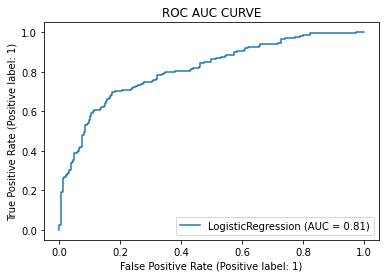

In [177]:
plot_roc_curve(LO,x_test,y_test)
plt.title('ROC AUC CURVE')
plt.show()

# CV_SCORE-->GaussianNB Classifier

In [178]:
pred_=GA.predict(x_test)
for i in range(2,10):
    test_accuracy=accuracy_score(y_test,pred) 
    cv_score=cross_val_score(GA,x,y,cv=i)
    Accuracy=cv_score.mean()
    std_score=cv_score.std()
    print(f'At cross fold  CV {i},and the mean_score is:{Accuracy} and the test accuracy is {test_accuracy}')
    print('\n')

At cross fold  CV 2,and the mean_score is:0.4748580697485807 and the test accuracy is 0.7246963562753036


At cross fold  CV 3,and the mean_score is:0.5900243309002433 and the test accuracy is 0.7246963562753036


At cross fold  CV 4,and the mean_score is:0.629762913342735 and the test accuracy is 0.7246963562753036


At cross fold  CV 5,and the mean_score is:0.6427581279615016 and the test accuracy is 0.7246963562753036


At cross fold  CV 6,and the mean_score is:0.6557177615571778 and the test accuracy is 0.7246963562753036


At cross fold  CV 7,and the mean_score is:0.6609913634524115 and the test accuracy is 0.7246963562753036


At cross fold  CV 8,and the mean_score is:0.6646413861219687 and the test accuracy is 0.7246963562753036


At cross fold  CV 9,and the mean_score is:0.6626115166261152 and the test accuracy is 0.7246963562753036




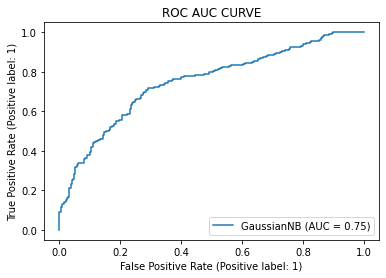

In [179]:
plot_roc_curve(GA,x_test,y_test)
plt.title('ROC AUC CURVE')
plt.show()

# CV_SCORE-->Decision Tree Classifier

In [180]:
pred=DTC.predict(x_test)
for i in range(2,10):
    test_accuracy=accuracy_score(y_test,pred) 
    cv_score=cross_val_score(DTC,x,y,cv=i)
    Accuracy=cv_score.mean()
    std_score=cv_score.std()
    print(f'At cross fold  CV {i},and the mean_score is:{Accuracy} and the test accuracy is {test_accuracy}')
    print('\n')

At cross fold  CV 2,and the mean_score is:0.4460665044606651 and the test accuracy is 0.97165991902834


At cross fold  CV 3,and the mean_score is:0.5255474452554745 and the test accuracy is 0.97165991902834


At cross fold  CV 4,and the mean_score is:0.6095404291818393 and the test accuracy is 0.97165991902834


At cross fold  CV 5,and the mean_score is:0.6980340146668746 and the test accuracy is 0.97165991902834


At cross fold  CV 6,and the mean_score is:0.7262773722627737 and the test accuracy is 0.97165991902834


At cross fold  CV 7,and the mean_score is:0.7340950480114786 and the test accuracy is 0.97165991902834


At cross fold  CV 8,and the mean_score is:0.7438440402639432 and the test accuracy is 0.97165991902834


At cross fold  CV 9,and the mean_score is:0.7558799675587997 and the test accuracy is 0.97165991902834




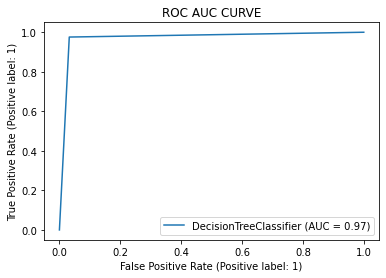

In [181]:
plot_roc_curve(DTC,x_test,y_test)
plt.title('ROC AUC CURVE')
plt.show()

# CV_SCOER-->SVC

In [182]:
pred=SV.predict(x_test)
for i in range(2,10):
    test_accuracy=accuracy_score(y_test,pred) 
    cv_score=cross_val_score(SV,x,y,cv=i)
    Accuracy=cv_score.mean()
    std_score=cv_score.std()
    print(f'At cross fold  CV {i},and the mean_score is:{Accuracy} and the test accuracy is {test_accuracy}')
    print('\n')

At cross fold  CV 2,and the mean_score is:0.5936739659367396 and the test accuracy is 0.9352226720647774


At cross fold  CV 3,and the mean_score is:0.7502027575020276 and the test accuracy is 0.9352226720647774


At cross fold  CV 4,and the mean_score is:0.8195624776358164 and the test accuracy is 0.9352226720647774


At cross fold  CV 5,and the mean_score is:0.8447224708674479 and the test accuracy is 0.9352226720647774


At cross fold  CV 6,and the mean_score is:0.8499594484995945 and the test accuracy is 0.9352226720647774


At cross fold  CV 7,and the mean_score is:0.8581132040763769 and the test accuracy is 0.9352226720647774


At cross fold  CV 8,and the mean_score is:0.8621732232169126 and the test accuracy is 0.9352226720647774


At cross fold  CV 9,and the mean_score is:0.8698296836982968 and the test accuracy is 0.9352226720647774




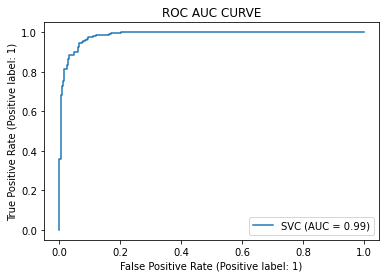

In [183]:
plot_roc_curve(SV,x_test,y_test)
plt.title('ROC AUC CURVE')
plt.show()

# CV_SCORE-->KNeighbors Classifier

In [184]:
pred=KN.predict(x_test)
for i in range(2,10):
    test_accuracy=accuracy_score(y_test,pred) 
    cv_score=cross_val_score(KN,x,y,cv=i)
    Accuracy=cv_score.mean()
    std_score=cv_score.std()
    print(f'At cross fold  CV {i},and the mean_score is:{Accuracy} and the test accuracy is {test_accuracy}')
    print('\n')

At cross fold  CV 2,and the mean_score is:0.6735604217356042 and the test accuracy is 0.8340080971659919


At cross fold  CV 3,and the mean_score is:0.7262773722627737 and the test accuracy is 0.8340080971659919


At cross fold  CV 4,and the mean_score is:0.7530579732261256 and the test accuracy is 0.8340080971659919


At cross fold  CV 5,and the mean_score is:0.759546197370474 and the test accuracy is 0.8340080971659919


At cross fold  CV 6,and the mean_score is:0.7700729927007299 and the test accuracy is 0.8340080971659919


At cross fold  CV 7,and the mean_score is:0.7733297156101688 and the test accuracy is 0.8340080971659919


At cross fold  CV 8,and the mean_score is:0.782253446391796 and the test accuracy is 0.8340080971659919


At cross fold  CV 9,and the mean_score is:0.7810218978102189 and the test accuracy is 0.8340080971659919




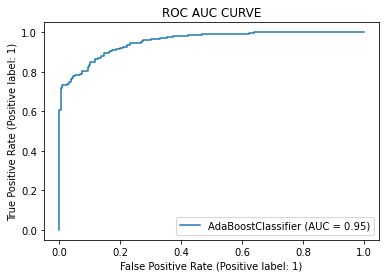

In [185]:
plot_roc_curve(AD,x_test,y_test)
plt.title('ROC AUC CURVE')
plt.show()

# CV_SCORE-->Ada Boost Classifier

In [186]:
pred=AD.predict(x_test)
for i in range(2,10):
    test_accuracy=accuracy_score(y_test,pred) 
    cv_score=cross_val_score(AD,x,y,cv=i)
    Accuracy=cv_score.mean()
    std_score=cv_score.std()
    print(f'At cross fold  CV {i},and the mean_score is:{Accuracy} and the test accuracy is {test_accuracy}')
    print('\n')

At cross fold  CV 2,and the mean_score is:0.4395782643957826 and the test accuracy is 0.868421052631579


At cross fold  CV 3,and the mean_score is:0.4720194647201947 and the test accuracy is 0.868421052631579


At cross fold  CV 4,and the mean_score is:0.4825921141257446 and the test accuracy is 0.868421052631579


At cross fold  CV 5,and the mean_score is:0.5041717650343678 and the test accuracy is 0.868421052631579


At cross fold  CV 6,and the mean_score is:0.597323600973236 and the test accuracy is 0.868421052631579


At cross fold  CV 7,and the mean_score is:0.615657536514477 and the test accuracy is 0.868421052631579


At cross fold  CV 8,and the mean_score is:0.6574609654099945 and the test accuracy is 0.868421052631579


At cross fold  CV 9,and the mean_score is:0.6804541768045418 and the test accuracy is 0.868421052631579




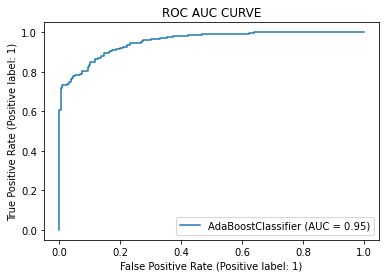

In [187]:
plot_roc_curve(AD,x_test,y_test)
plt.title('ROC AUC CURVE')
plt.show()

# CV_SCORE-->Gradient Boosting Classifier

In [188]:
pred=GR.predict(x_test)
for i in range(2,10):
    test_accuracy=accuracy_score(y_test,pred) 
    cv_score=cross_val_score(GR,x,y,cv=i)
    Accuracy=cv_score.mean()
    std_score=cv_score.std()
    print(f'At cross fold  CV {i},and the mean_score is:{Accuracy} and the test accuracy is {test_accuracy}')
    print('\n')

At cross fold  CV 2,and the mean_score is:0.4440389294403893 and the test accuracy is 0.9534412955465587


At cross fold  CV 3,and the mean_score is:0.4537712895377129 and the test accuracy is 0.9534412955465587


At cross fold  CV 4,and the mean_score is:0.5052930760487486 and the test accuracy is 0.9534412955465587


At cross fold  CV 5,and the mean_score is:0.6197362261950712 and the test accuracy is 0.9534412955465587


At cross fold  CV 6,and the mean_score is:0.6772100567721006 and the test accuracy is 0.9534412955465587


At cross fold  CV 7,and the mean_score is:0.7219162742356794 and the test accuracy is 0.9534412955465587


At cross fold  CV 8,and the mean_score is:0.7486905287269365 and the test accuracy is 0.9534412955465587


At cross fold  CV 9,and the mean_score is:0.7931873479318735 and the test accuracy is 0.9534412955465587




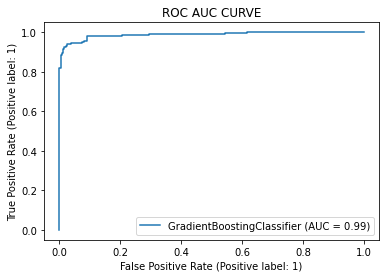

In [189]:
plot_roc_curve(GR,x_test,y_test)
plt.title('ROC AUC CURVE')
plt.show()

# CV_SCORE-->Random Forest Classifier

In [190]:
pred=RF.predict(x_test)
for i in range(2,10):
    test_accuracy=accuracy_score(y_test,pred) 
    cv_score=cross_val_score(RF,x,y,cv=i)
    Accuracy=cv_score.mean()
    std_score=cv_score.std()
    print(f'At cross fold  CV {i},and the mean_score is:{Accuracy} and the test accuracy is {test_accuracy}')
    print('\n')

At cross fold  CV 2,and the mean_score is:0.4659367396593674 and the test accuracy is 0.9534412955465587


At cross fold  CV 3,and the mean_score is:0.5831305758313058 and the test accuracy is 0.9534412955465587


At cross fold  CV 4,and the mean_score is:0.6853398829695426 and the test accuracy is 0.9534412955465587


At cross fold  CV 5,and the mean_score is:0.7701948739847747 and the test accuracy is 0.9534412955465587


At cross fold  CV 6,and the mean_score is:0.851581508515815 and the test accuracy is 0.9534412955465587


At cross fold  CV 7,and the mean_score is:0.8894034435819138 and the test accuracy is 0.9534412955465587


At cross fold  CV 8,and the mean_score is:0.9060424809818013 and the test accuracy is 0.9534412955465587


At cross fold  CV 9,and the mean_score is:0.9164639091646392 and the test accuracy is 0.9534412955465587




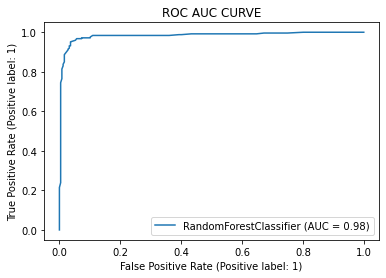

In [191]:
plot_roc_curve(RF,x_test,y_test)
plt.title('ROC AUC CURVE')
plt.show()

#### Try another model selection for best model accuracy score

# METHOD-->GRID SEARCH CV

In [192]:
dict1={'criterion':['gini','entropy','log_loss'],'max_features':['sqrt','log2','None'],'n_estimators':[100,200,300,400,500],
      'max_depth':[3,4,5,6,7]}

In [193]:
Gs=GridSearchCV(RF,dict1,cv=9)
Gs

GridSearchCV(cv=9, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [3, 4, 5, 6, 7],
                         'max_features': ['sqrt', 'log2', 'None'],
                         'n_estimators': [100, 200, 300, 400, 500]})

In [194]:
Gs.fit(x,y)

GridSearchCV(cv=9, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [3, 4, 5, 6, 7],
                         'max_features': ['sqrt', 'log2', 'None'],
                         'n_estimators': [100, 200, 300, 400, 500]})

In [195]:
Gs.best_params_

{'criterion': 'gini',
 'max_depth': 7,
 'max_features': 'log2',
 'n_estimators': 300}

In [196]:
Gs.best_score_

0.8673965936739659

In [197]:
Gs.best_estimator_

RandomForestClassifier(max_depth=7, max_features='log2', n_estimators=300)

# Analyse model with full feature

In [198]:
Rf=RandomForestClassifier(criterion='gini',max_features='log2',n_estimators=300,max_depth=7)
Rf.fit(x_train,y_train)
pred_test=Rf.predict(x_test)
print(f"Confusion Matrix : {confusion_matrix(y_test,pred_test)}")
print(f"Classification Report : {classification_report(y_test,pred_test)}")
print(f"Accuracy Score of Model  : {(accuracy_score(y_test,pred_test)*100)}")
print(f"Dataset Score : {(Rf.score(x_train,y_train))*100}")

Confusion Matrix : [[224  23]
 [ 19 228]]
Classification Report :               precision    recall  f1-score   support

           0       0.92      0.91      0.91       247
           1       0.91      0.92      0.92       247

    accuracy                           0.91       494
   macro avg       0.92      0.91      0.91       494
weighted avg       0.92      0.91      0.91       494

Accuracy Score of Model  : 91.49797570850203
Dataset Score : 95.131845841785


# Plot AUC-ROC CURVE For Model

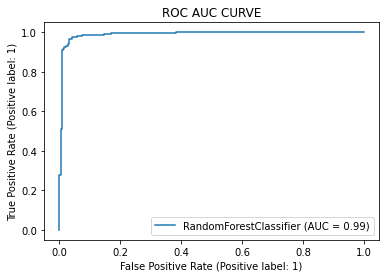

In [199]:
plot_roc_curve(Gs.best_estimator_,x_test,y_test)
plt.title('ROC AUC CURVE')
plt.show()